<a href="https://colab.research.google.com/github/manoharreddyvoladri/Data-science-/blob/main/21BRS1177_LAB6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Lab Experiment - 06
# Machine learning for Robotics

print("Voladri Manohar Reddy  21BRS1177")

# 1.	The SBI.csv dataset contains the information of more than 2300 children that attended the emergency services with fever and were tested for serious bacterial infection. The outcome sbi has 4 categories: Not Applicable(no infection) / UTI / Pneum / Bact
# a.	Compute EDA
# b.	Build a multinomial model using wcc, age, prevAB, pct, and crp to predict sbi
# c.	Compute the confusion matrix  and related measures
# d.	How does the model classify a child with 1 year of age, WCC=29, PCT=5, CRP=200 and no prevAB?

# 2.	The bdiag.csv  comprised of several imaging details from patients that had a biopsy to test for breast cancer.The variable Diagnosis classifies the biopsied tissue as M = malignant or B = benign.
# a.	Compute EDA
# b.	Fit a Binomial logistic regression to  predict Diagnosis  using texture_mean and radius_mean.
# c.	Build the confusion matrix for the model above
# d.	Calculate the area and the ROC curve for the model in a).
# https://developers.google.com/machine-learning/crash-course/classification/roc-and-auc#:~:text=An%20ROC%20curve%20(receiver%20operating,False%20Positive%20Rate

# e.	Plot the scatter plot for texture_mean and radius_mean and draw the border line for the prediction of Diagnosis based on the model in a)

# 3.	The Diamond.csv  comprised of details of a diamonds. There is a variable named cut telling about the condition of the diamond in an ordinary way. That means there are categories Ideal, premium, good, very good, and fair that represent how good the diamond is.
# a.	Compute EDA
# b.	Fit a Binomial logistic regression to  predict cut
# c.	Build the confusion matrix for the model above
# d.	Calculate the area and the ROC curve for the model in a).
# e.	Plot the model.
# https://www.statsmodels.org/devel/examples/notebooks/generated/ordinal_regression.html



Voladri Manohar Reddy  21BRS1177


In [ ]:
# 1.	The SBI.csv dataset contains the information of more than 2300 children that attended the emergency services with fever and were tested for serious bacterial infection. The outcome sbi has 4 categories: Not Applicable(no infection) / UTI / Pneum / Bact
# a.	Compute EDA

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')


In [ ]:
data = pd.read_csv("SBI.csv")
data.head()

,Unnamed: 0,id,fever_hours,age,sex,wcc,prevAB,sbi,pct,crp
0,1,57906,24.0,0.79,M,3.8,No,UTI,0.090000,17.700000
1,2,58031,48.0,1.91,F,25.3,Yes,UTI,4.400000,150.400000
2,3,58148,24.0,0.07,F,20.0,No,UTI,0.548136,47.359279
3,4,58169,72.0,0.95,M,6.0,No,UTI,0.310000,4.900000
4,5,58517,1.0,0.11,F,15.6,No,UTI,0.936872,31.394860


In [ ]:
data.tail()

,Unnamed: 0,id,fever_hours,age,sex,wcc,prevAB,sbi,pct,crp
2343,2344,229318,48.0,1.06,M,14.1,No,NotApplicable,0.160000,16.700000
2344,2345,229506,24.0,3.05,M,14.6,No,NotApplicable,1.080000,77.500000
2345,2346,229794,48.0,1.81,M,6.0,No,NotApplicable,0.480000,75.300000
2346,2347,229962,24.0,1.24,M,16.3,Yes,NotApplicable,20.280000,17.300000
2347,2348,229985,24.0,3.56,F,13.0,No,NotApplicable,0.606293,18.181134


In [ ]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2348 entries, 0 to 2347
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   2348 non-null   int64  
 1   id           2348 non-null   int64  
 2   fever_hours  2348 non-null   float64
 3   age          2348 non-null   float64
 4   sex          2348 non-null   object 
 5   wcc          2348 non-null   float64
 6   prevAB       2348 non-null   object 
 7   sbi          2348 non-null   object 
 8   pct          2348 non-null   float64
 9   crp          2348 non-null   float64
dtypes: float64(5), int64(2), object(3)
memory usage: 183.6+ KB


In [ ]:
data.isnull().sum()

Unnamed: 0     0
id             0
fever_hours    0
age            0
sex            0
wcc            0
prevAB         0
sbi            0
pct            0
crp            0
dtype: int64

In [ ]:
(data.isnull().sum()/(len(data)))*100

Unnamed: 0     0.0
id             0.0
fever_hours    0.0
age            0.0
sex            0.0
wcc            0.0
prevAB         0.0
sbi            0.0
pct            0.0
crp            0.0
dtype: float64

In [ ]:
data = data.drop(['Unnamed: 0'], axis = 1)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2348 entries, 0 to 2347
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           2348 non-null   int64  
 1   fever_hours  2348 non-null   float64
 2   age          2348 non-null   float64
 3   sex          2348 non-null   object 
 4   wcc          2348 non-null   float64
 5   prevAB       2348 non-null   object 
 6   sbi          2348 non-null   object 
 7   pct          2348 non-null   float64
 8   crp          2348 non-null   float64
dtypes: float64(5), int64(1), object(3)
memory usage: 165.2+ KB


In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
id,2348.0,153698.344549,51071.687612,495.000000,133039.250000,160015.500000,196030.000000,229986.00
fever_hours,2348.0,80.060605,162.713141,0.000000,24.000000,48.000000,78.000000,3360.00
age,2348.0,1.835720,1.326684,0.010000,0.760000,1.525000,2.752500,4.99
wcc,2348.0,12.643110,6.421293,0.236790,7.900000,11.600000,16.100000,58.70
pct,2348.0,3.743542,7.599784,0.008647,0.160000,0.760000,4.619953,156.47
crp,2348.0,48.414266,52.628054,0.000000,11.825489,30.972059,66.200000,429.90


In [ ]:
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,2348.0,NaN,NaN,NaN,153698.344549,51071.687612,495.0,133039.25,160015.5,196030.0,229986.0
fever_hours,2348.0,NaN,NaN,NaN,80.060605,162.713141,0.0,24.0,48.0,78.0,3360.0
age,2348.0,NaN,NaN,NaN,1.83572,1.326684,0.01,0.76,1.525,2.7525,4.99
sex,2348,2,M,1335,NaN,NaN,NaN,NaN,NaN,NaN,NaN
wcc,2348.0,NaN,NaN,NaN,12.64311,6.421293,0.23679,7.9,11.6,16.1,58.7
prevAB,2348,2,No,1370,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sbi,2348,4,NotApplicable,1752,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pct,2348.0,NaN,NaN,NaN,3.743542,7.599784,0.008647,0.16,0.76,4.619953,156.47
crp,2348.0,NaN,NaN,NaN,48.414266,52.628054,0.0,11.825489,30.972059,66.2,429.9


In [ ]:
cat_cols=data.select_dtypes(include=['object']).columns
num_cols = data.select_dtypes(include=np.number).columns.tolist()
print("Categorical Variables:")
print(cat_cols)
print("\nNumerical Variables:")
print(num_cols)

Categorical Variables:
Index(['sex', 'prevAB', 'sbi'], dtype='object')

Numerical Variables:
['id', 'fever_hours', 'age', 'wcc', 'pct', 'crp']


id
Skew : -0.54


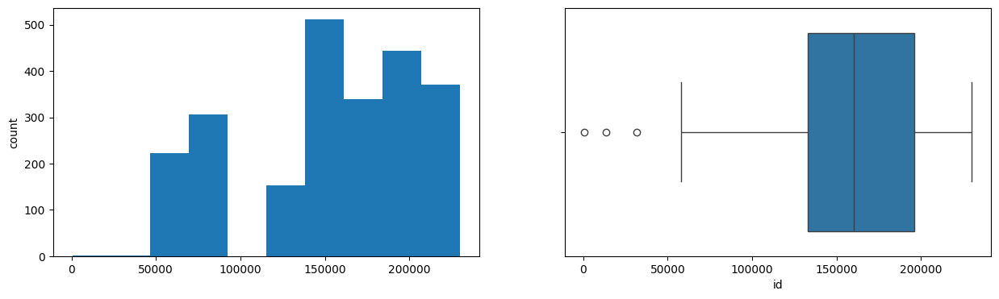

fever_hours
Skew : 9.66


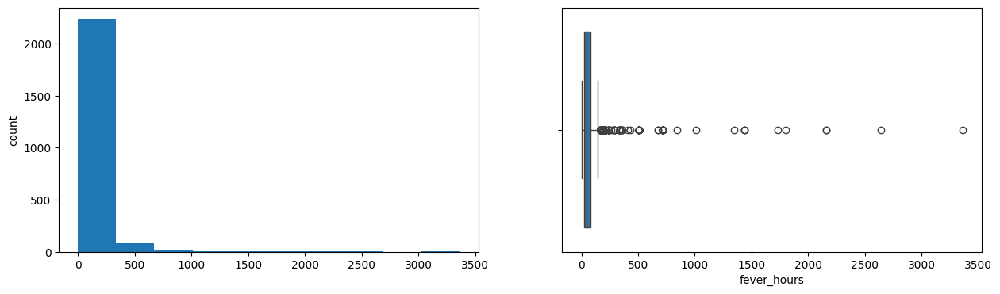

age
Skew : 0.62


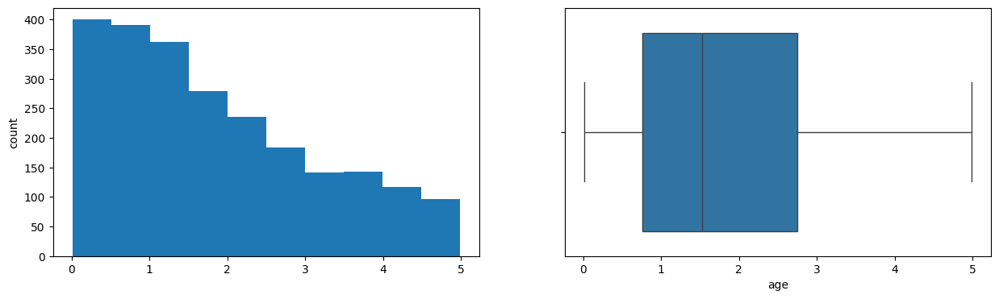

wcc
Skew : 1.19


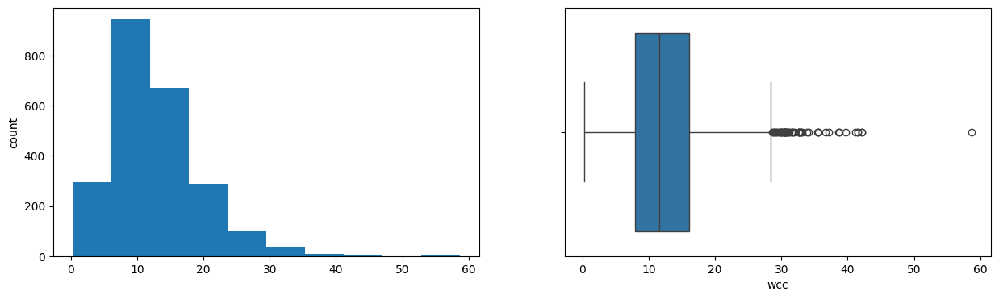

pct
Skew : 7.7


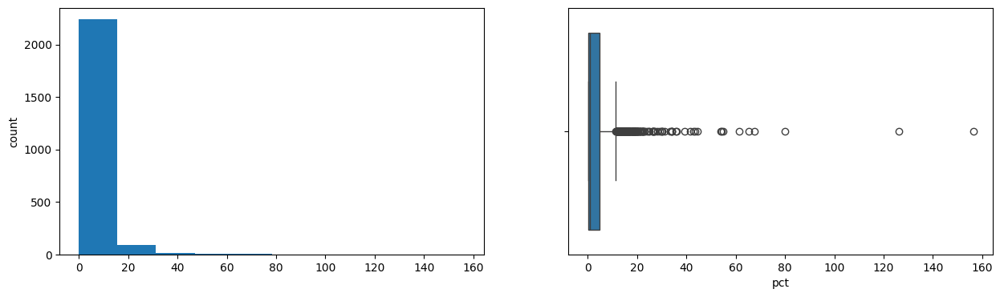

crp
Skew : 2.29


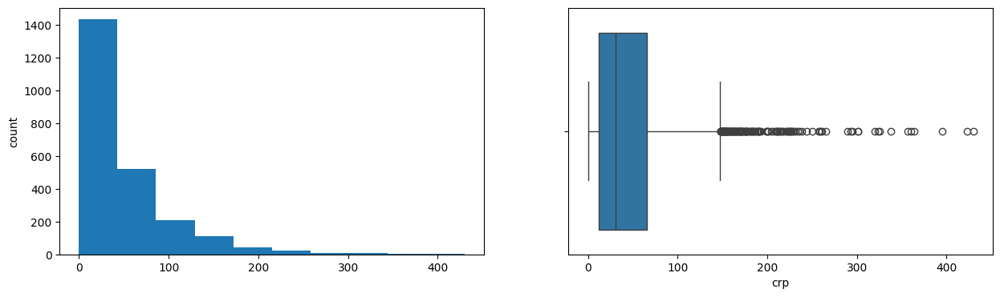

In [ ]:
for col in num_cols:
    print(col)
    print('Skew :', round(data[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    data[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=data[col])
    plt.show()

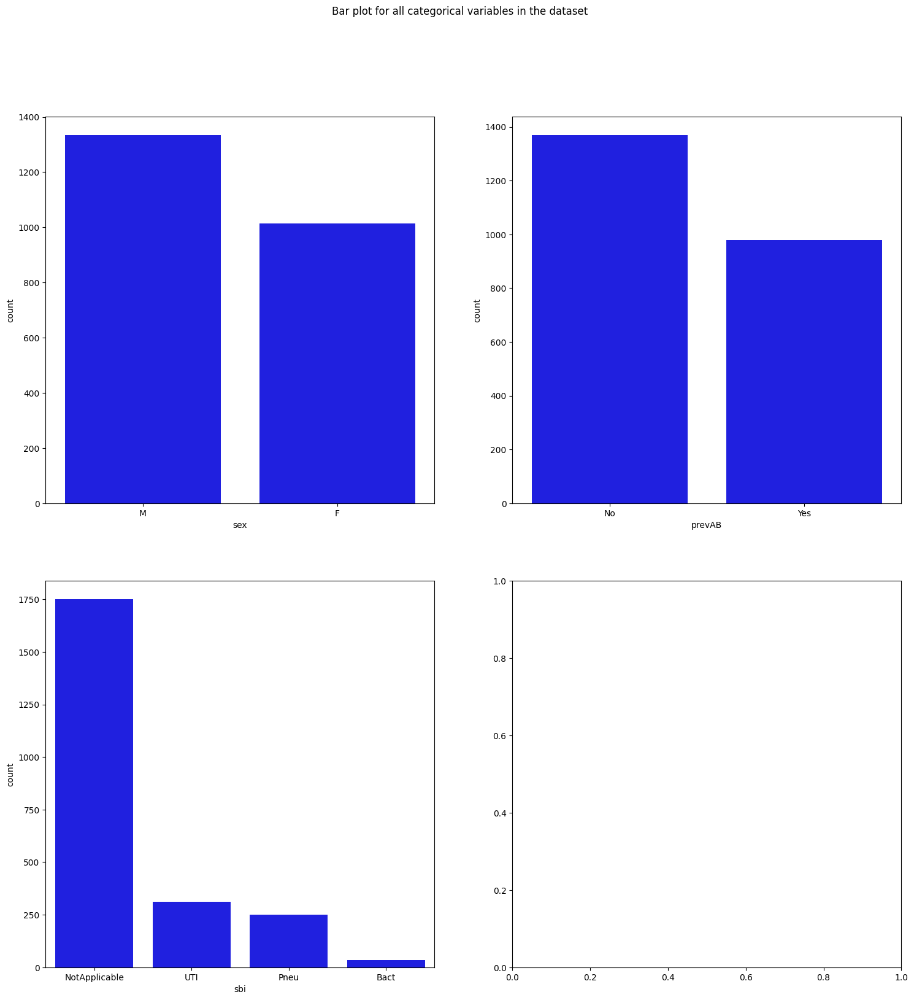

In [ ]:
fig, axes = plt.subplots(2, 2, figsize = (18, 18))
fig.suptitle('Bar plot for all categorical variables in the dataset')
sns.countplot(ax = axes[0, 0], x = 'sex', data = data, color = 'blue',
              order = data['sex'].value_counts().index);
sns.countplot(ax = axes[0, 1], x = 'prevAB', data = data, color = 'blue',
              order = data['prevAB'].value_counts().index);
sns.countplot(ax = axes[1, 0], x = 'sbi', data = data, color = 'blue',
              order = data['sbi'].value_counts().index);

In [ ]:
def log_transform(data,col):
    for colname in col:
        if (data[colname] == 1.0).all():
            data[colname + '_log'] = np.log(data[colname]+1)
        else:
            data[colname + '_log'] = np.log(data[colname])
    data.info()

In [ ]:
log_transform(data,['fever_hours','age'])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2348 entries, 0 to 2347
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               2348 non-null   int64  
 1   fever_hours      2348 non-null   float64
 2   age              2348 non-null   float64
 3   sex              2348 non-null   object 
 4   wcc              2348 non-null   float64
 5   prevAB           2348 non-null   object 
 6   sbi              2348 non-null   object 
 7   pct              2348 non-null   float64
 8   crp              2348 non-null   float64
 9   fever_hours_log  2348 non-null   float64
 10  age_log          2348 non-null   float64
dtypes: float64(7), int64(1), object(3)
memory usage: 201.9+ KB


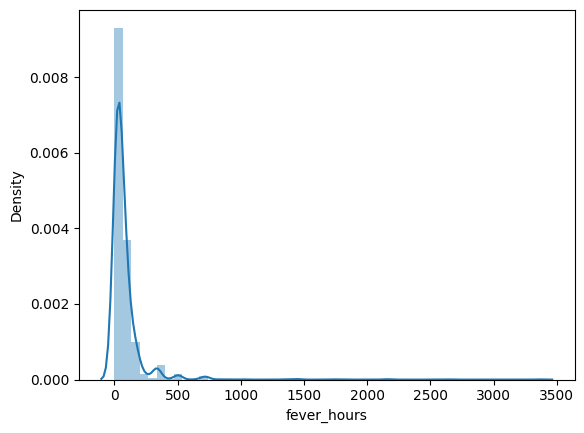

In [ ]:
sns.distplot(data["fever_hours"], axlabel="fever_hours");

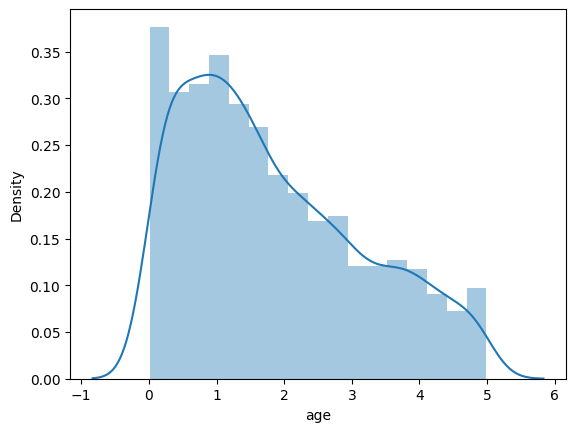

In [ ]:
sns.distplot(data["age"], axlabel="age");

<Figure size 1300x1700 with 0 Axes>

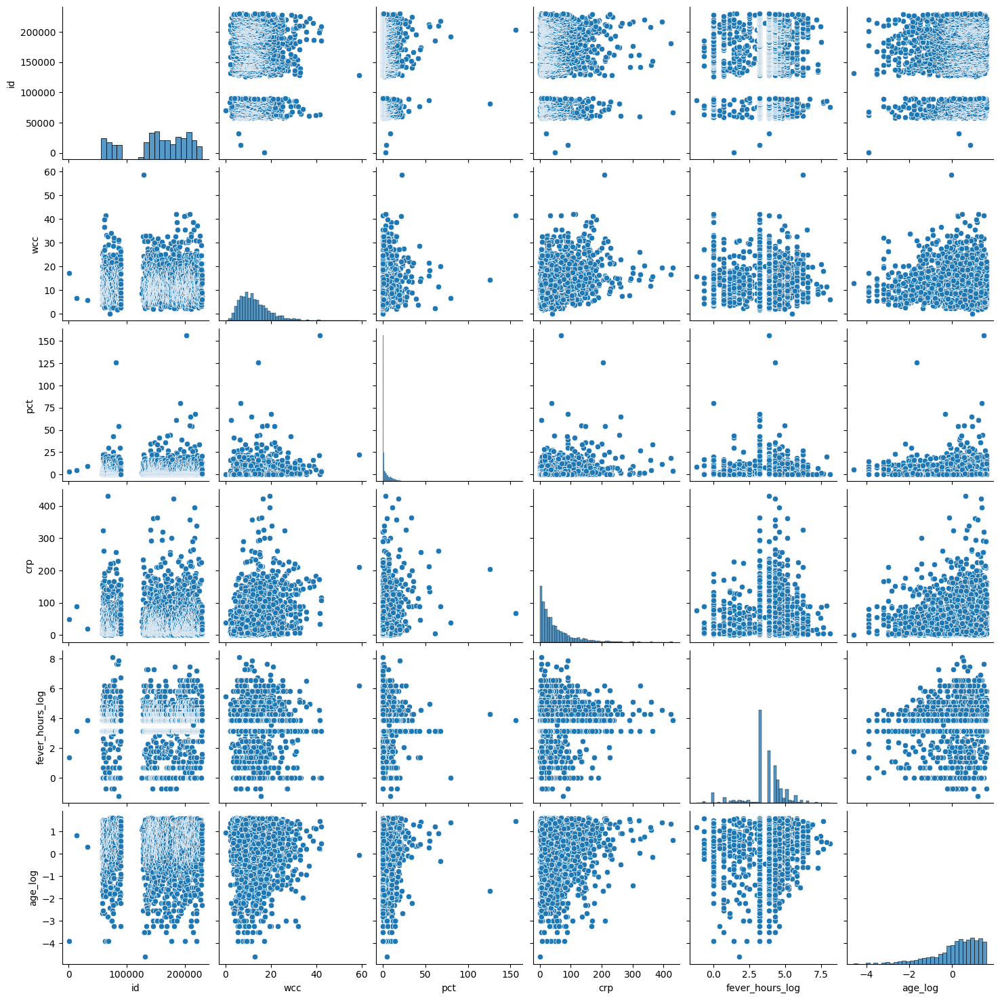

In [ ]:
plt.figure(figsize=(13,17))
sns.pairplot(data=data.drop(['fever_hours','age'],axis=1))
plt.show()

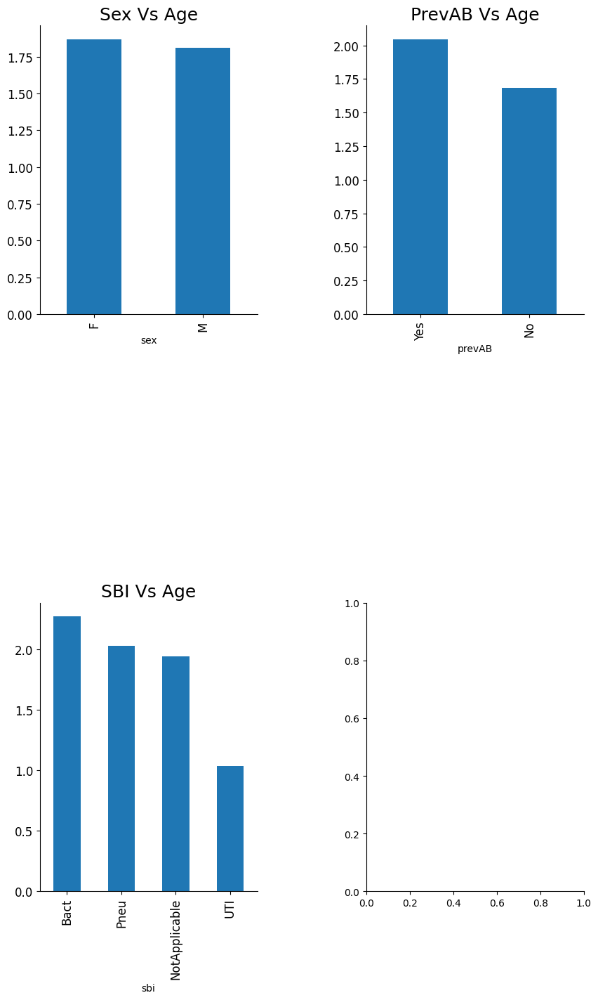

In [ ]:
fig, axarr = plt.subplots(2, 2, figsize=(10, 16))
data.groupby('sex')['age'].mean().sort_values(ascending=False).plot.bar(ax=axarr[0][0], fontsize=12)
axarr[0][0].set_title("Sex Vs Age", fontsize=18)
data.groupby('prevAB')['age'].mean().sort_values(ascending=False).plot.bar(ax=axarr[0][1], fontsize=12)
axarr[0][1].set_title("PrevAB Vs Age", fontsize=18)
data.groupby('sbi')['age'].mean().sort_values(ascending=False).plot.bar(ax=axarr[1][0], fontsize=12)
axarr[1][0].set_title("SBI Vs Age", fontsize=18)
plt.subplots_adjust(hspace=1.0)
plt.subplots_adjust(wspace=.5)
sns.despine()

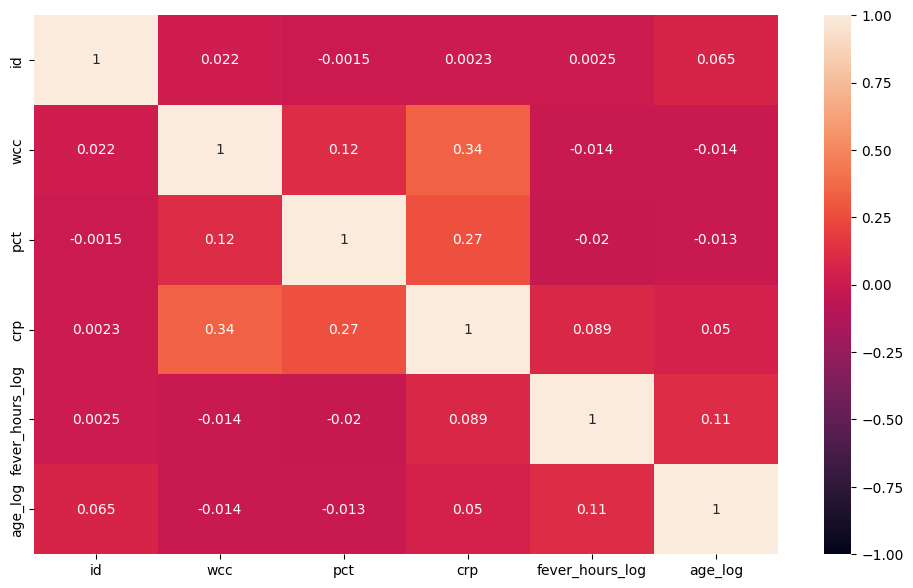

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
numeric_data = data.select_dtypes(include=['float64', 'int64'])
plt.figure(figsize=(12, 7))
sns.heatmap(numeric_data.drop(['fever_hours', 'age'], axis=1).corr(), annot=True, vmin=-1, vmax=1)
plt.show()

In [ ]:
print("b.	Build a multinomial model using wcc, age, prevAB, pct, and crp to predict sbi")

b.	Build a multinomial model using wcc, age, prevAB, pct, and crp to predict sbi


In [ ]:

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

df = pd.read_csv('SBI.csv')

In [ ]:
X = df[['wcc', 'age', 'prevAB', 'pct', 'crp']]
y = df['sbi']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import pandas as pd
X_train = pd.DataFrame({'numeric_col': [1, 2, 3],
                        'categorical_col': ['A', 'B', 'A']})
X_test = pd.DataFrame({'numeric_col': [4, 5, 6],
                       'categorical_col': ['C', 'A', 'B']})
numeric_features = ['numeric_col']
categorical_features = ['categorical_col']
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ],
    remainder='passthrough'
)
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor)
])
X_train_scaled = pipeline.fit_transform(X_train)
X_test_scaled = pipeline.transform(X_test)
print(X_train_scaled)
print(X_test_scaled)

[[-1.22474487  1.          0.        ]
 [ 0.          0.          1.        ]
 [ 1.22474487  1.          0.        ]]
[[2.44948974 0.         0.        ]
 [3.67423461 1.         0.        ]
 [4.89897949 0.         1.        ]]


In [ ]:
print(X_train_scaled.shape)
print(y_train.shape)

(3, 3)
(1878,)


In [ ]:
print("# c.	Compute the confusion matrix  and related measures")

# c.	Compute the confusion matrix  and related measures


In [ ]:
# c.	Compute the confusion matrix  and related measures

from sklearn.preprocessing import LabelEncoder

In [ ]:
df = pd.read_csv('SBI.csv')

In [ ]:
le = LabelEncoder()
df['prevAB'] = le.fit_transform(df['prevAB'])

In [ ]:
X = df[['wcc', 'age', 'prevAB', 'pct', 'crp']]
y = df['sbi']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
model.fit(X_train_scaled, y_train)

LogisticRegression(multi_class='multinomial')

In [ ]:
y_pred = model.predict(X_test_scaled)

In [ ]:
from sklearn.metrics import confusion_matrix
conf_matrix = confusion_matrix(y_test, y_pred)

In [ ]:
print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[  0   1   0   2]
 [  0 331   1  11]
 [  0  55   0   3]
 [  0  60   0   6]]


In [ ]:
from sklearn.metrics import classification_report
class_report = classification_report(y_test, y_pred)
print("\nClassification Report:")
print(class_report)


Classification Report:
               precision    recall  f1-score   support

         Bact       0.00      0.00      0.00         3
NotApplicable       0.74      0.97      0.84       343
         Pneu       0.00      0.00      0.00        58
          UTI       0.27      0.09      0.14        66

     accuracy                           0.72       470
    macro avg       0.25      0.26      0.24       470
 weighted avg       0.58      0.72      0.63       470



In [ ]:
print("Shape of X_train_scaled:", X_train_scaled.shape)
print("Shape of y_train:", y_train.shape)

Shape of X_train_scaled: (1878, 5)
Shape of y_train: (1878,)


In [ ]:
print("d.	How does the model classify a child with 1 year of age, WCC=29, PCT=5, CRP=200 and no prevAB? ")

d.	How does the model classify a child with 1 year of age, WCC=29, PCT=5, CRP=200 and no prevAB? 


In [ ]:
#d.	How does the model classify a child with 1 year of age, WCC=29, PCT=5, CRP=200 and no prevAB?
new_instance = [[29, 1, 0, 5, 200]]  # WCC=29, age=1, prevAB=0, PCT=5, CRP=200
scaled_instance = scaler.transform(new_instance)
predicted_class = model.predict(scaled_instance)
print("\nPredicted class for new instance:", predicted_class[0])



Predicted class for new instance: UTI


**2.	The bdiag.csv  comprised of several imaging details from patients that had a biopsy to test for breast cancer.The variable Diagnosis classifies the biopsied tissue as M = malignant or B = benign.**

a.	Compute EDA

b.	Fit a Binomial logistic regression to  predict Diagnosis  using texture_mean and radius_mean.

c.	Build the confusion matrix for the model above

d.	Calculate the area and the ROC curve for the model in a.

(https://developers.google.com/machine-learning/crash-course/classification/roc-and-auc#:~:text=An%20ROC%20curve%20receiver%20operating,False%20Positive%20Rate)

e.	Plot the scatter plot for texture_mean and radius_mean and draw the border line for the prediction of Diagnosis based on the model in a)




In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
data = pd.read_csv("bdiag.csv")

In [ ]:
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
data.tail()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400
568,92751,B,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,...,9.456,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [ ]:
data.nunique()

id                         569
diagnosis                    2
radius_mean                456
texture_mean               479
perimeter_mean             522
area_mean                  539
smoothness_mean            474
compactness_mean           537
concavity_mean             537
concave points_mean        542
symmetry_mean              432
fractal_dimension_mean     499
radius_se                  540
texture_se                 519
perimeter_se               533
area_se                    528
smoothness_se              547
compactness_se             541
concavity_se               533
concave points_se          507
symmetry_se                498
fractal_dimension_se       545
radius_worst               457
texture_worst              511
perimeter_worst            514
area_worst                 544
smoothness_worst           411
compactness_worst          529
concavity_worst            539
concave points_worst       492
symmetry_worst             500
fractal_dimension_worst    535
dtype: i

In [ ]:
data.isnull().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [ ]:
(data.isnull().sum()/(len(data)))*100

id                         0.0
diagnosis                  0.0
radius_mean                0.0
texture_mean               0.0
perimeter_mean             0.0
area_mean                  0.0
smoothness_mean            0.0
compactness_mean           0.0
concavity_mean             0.0
concave points_mean        0.0
symmetry_mean              0.0
fractal_dimension_mean     0.0
radius_se                  0.0
texture_se                 0.0
perimeter_se               0.0
area_se                    0.0
smoothness_se              0.0
compactness_se             0.0
concavity_se               0.0
concave points_se          0.0
symmetry_se                0.0
fractal_dimension_se       0.0
radius_worst               0.0
texture_worst              0.0
perimeter_worst            0.0
area_worst                 0.0
smoothness_worst           0.0
compactness_worst          0.0
concavity_worst            0.0
concave points_worst       0.0
symmetry_worst             0.0
fractal_dimension_worst    0.0
dtype: f

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
id,569.0,3.037183e+07,1.250206e+08,8670.000000,869218.000000,906024.000000,8.813129e+06,9.113205e+08
radius_mean,569.0,1.412729e+01,3.524049e+00,6.981000,11.700000,13.370000,1.578000e+01,2.811000e+01
texture_mean,569.0,1.928965e+01,4.301036e+00,9.710000,16.170000,18.840000,2.180000e+01,3.928000e+01
perimeter_mean,569.0,9.196903e+01,2.429898e+01,43.790000,75.170000,86.240000,1.041000e+02,1.885000e+02
area_mean,569.0,6.548891e+02,3.519141e+02,143.500000,420.300000,551.100000,7.827000e+02,2.501000e+03
smoothness_mean,569.0,9.636028e-02,1.406413e-02,0.052630,0.086370,0.095870,1.053000e-01,1.634000e-01
compactness_mean,569.0,1.043410e-01,5.281276e-02,0.019380,0.064920,0.092630,1.304000e-01,3.454000e-01
concavity_mean,569.0,8.879932e-02,7.971981e-02,0.000000,0.029560,0.061540,1.307000e-01,4.268000e-01
concave points_mean,569.0,4.891915e-02,3.880284e-02,0.000000,0.020310,0.033500,7.400000e-02,2.012000e-01
symmetry_mean,569.0,1.811619e-01,2.741428e-02,0.106000,0.161900,0.179200,1.957000e-01,3.040000e-01


In [ ]:
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,569.0,NaN,NaN,NaN,30371831.432337,125020585.612224,8670.0,869218.0,906024.0,8813129.0,911320502.0
diagnosis,569,2,B,357,NaN,NaN,NaN,NaN,NaN,NaN,NaN
radius_mean,569.0,NaN,NaN,NaN,14.127292,3.524049,6.981,11.7,13.37,15.78,28.11
texture_mean,569.0,NaN,NaN,NaN,19.289649,4.301036,9.71,16.17,18.84,21.8,39.28
perimeter_mean,569.0,NaN,NaN,NaN,91.969033,24.298981,43.79,75.17,86.24,104.1,188.5
area_mean,569.0,NaN,NaN,NaN,654.889104,351.914129,143.5,420.3,551.1,782.7,2501.0
smoothness_mean,569.0,NaN,NaN,NaN,0.09636,0.014064,0.05263,0.08637,0.09587,0.1053,0.1634
compactness_mean,569.0,NaN,NaN,NaN,0.104341,0.052813,0.01938,0.06492,0.09263,0.1304,0.3454
concavity_mean,569.0,NaN,NaN,NaN,0.088799,0.07972,0.0,0.02956,0.06154,0.1307,0.4268
concave points_mean,569.0,NaN,NaN,NaN,0.048919,0.038803,0.0,0.02031,0.0335,0.074,0.2012


In [ ]:
cat_cols=data.select_dtypes(include=['object']).columns
num_cols = data.select_dtypes(include=np.number).columns.tolist()
print("Categorical Variables:")
print(cat_cols)
print("\nNumerical Variables:")
print(num_cols)

Categorical Variables:
Index(['diagnosis'], dtype='object')

Numerical Variables:
['id', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


id
Skew : 6.47


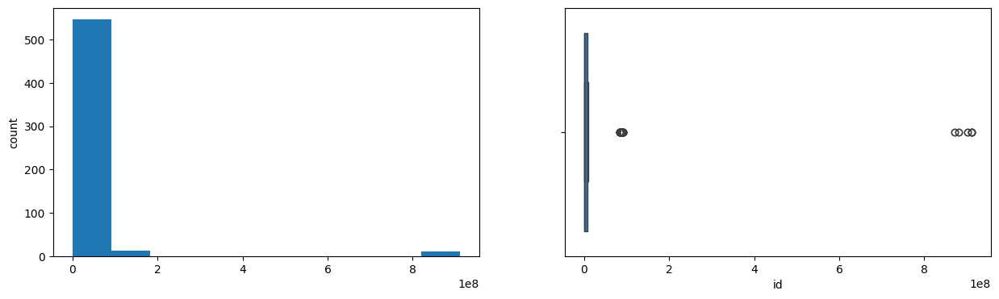

radius_mean
Skew : 0.94


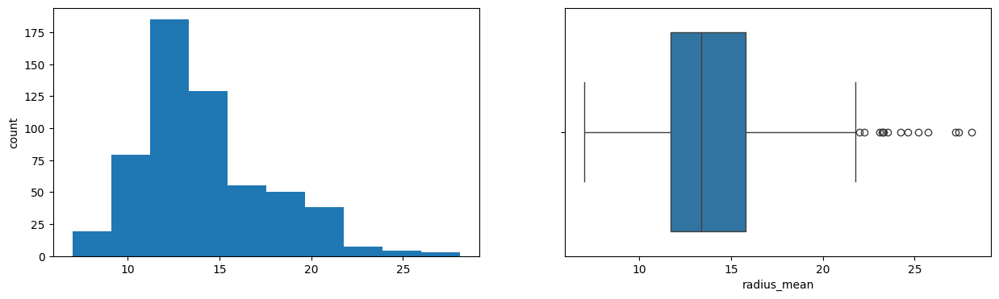

texture_mean
Skew : 0.65


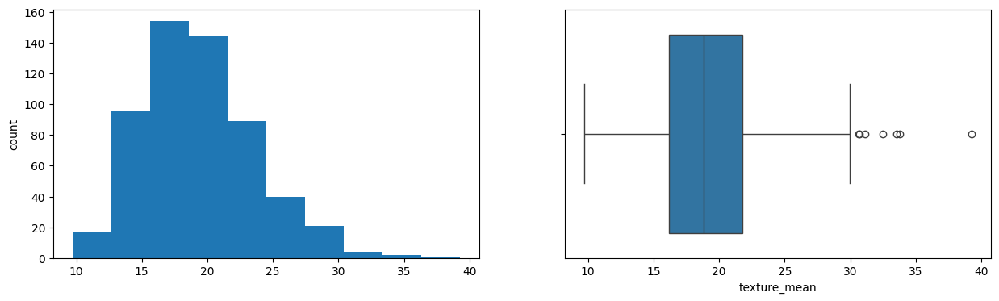

perimeter_mean
Skew : 0.99


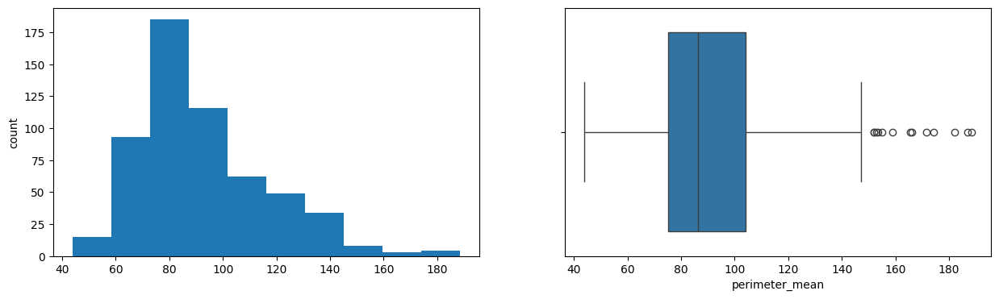

area_mean
Skew : 1.65


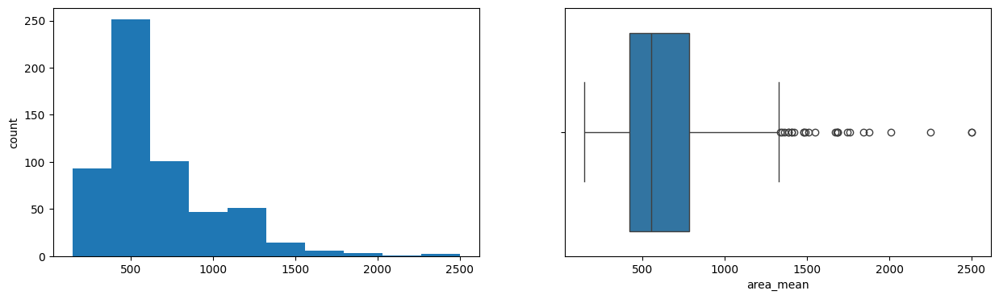

smoothness_mean
Skew : 0.46


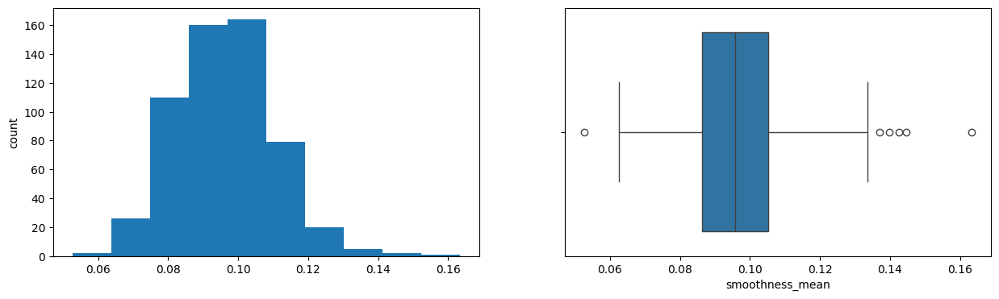

compactness_mean
Skew : 1.19


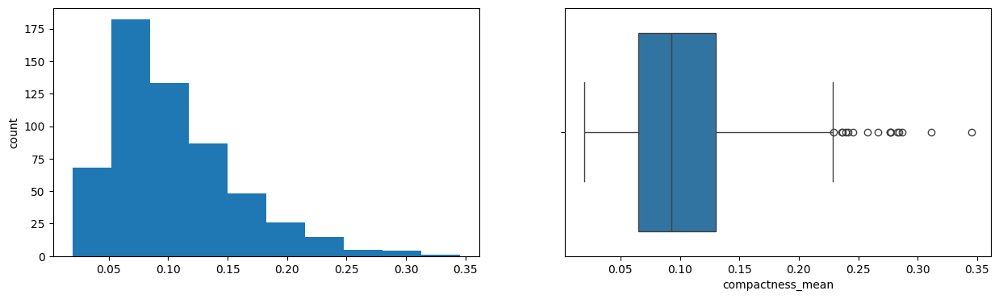

concavity_mean
Skew : 1.4


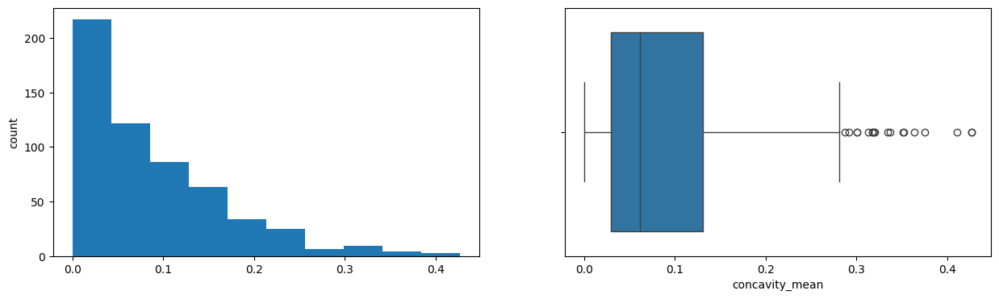

concave points_mean
Skew : 1.17


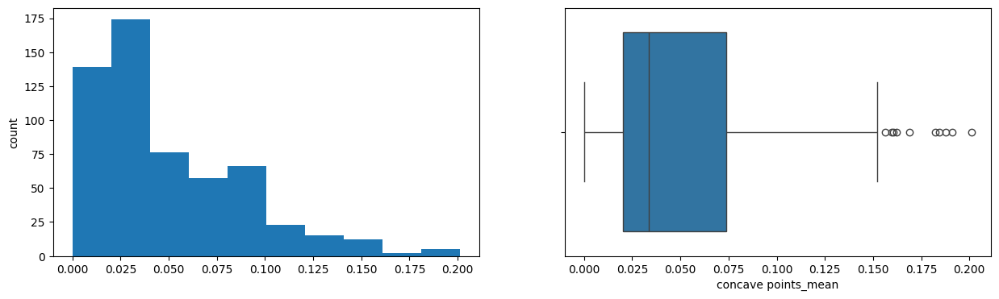

symmetry_mean
Skew : 0.73


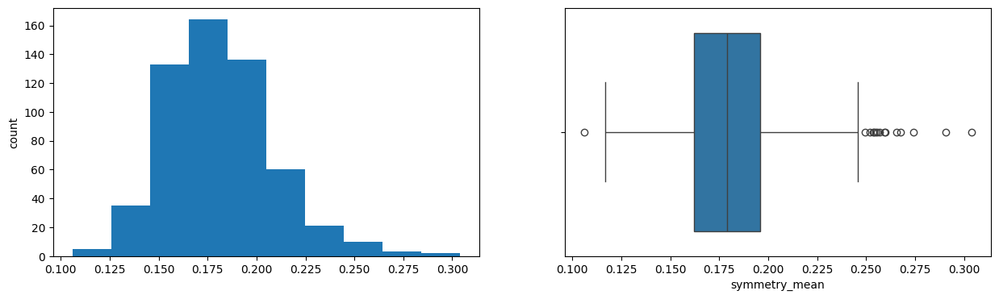

fractal_dimension_mean
Skew : 1.3


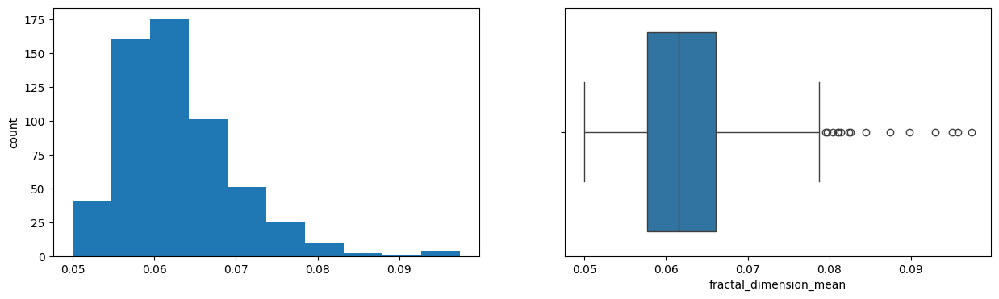

radius_se
Skew : 3.09


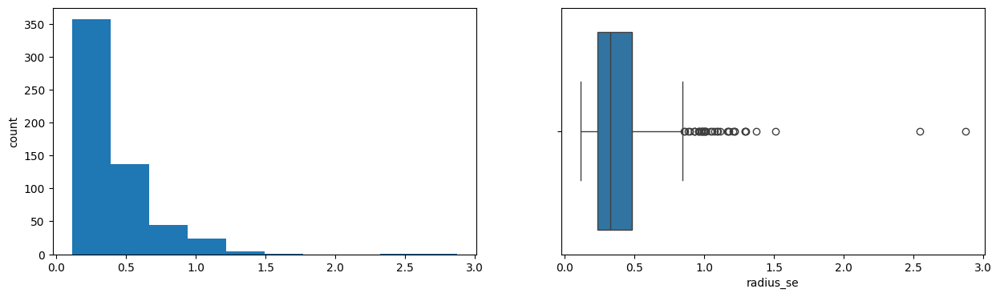

texture_se
Skew : 1.65


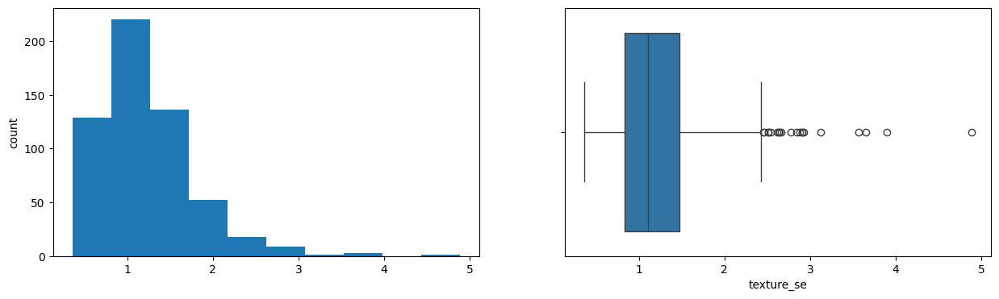

perimeter_se
Skew : 3.44


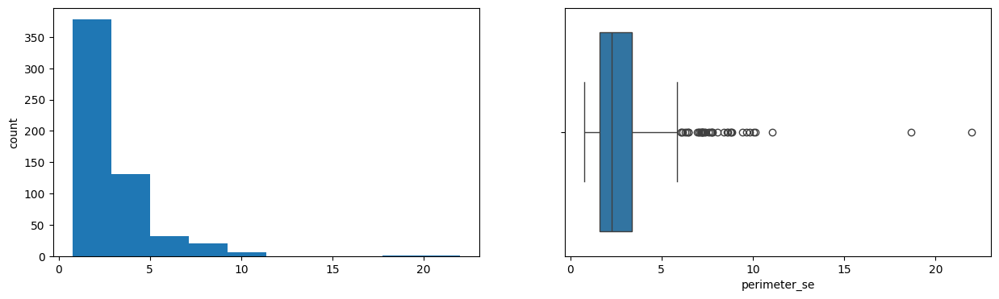

area_se
Skew : 5.45


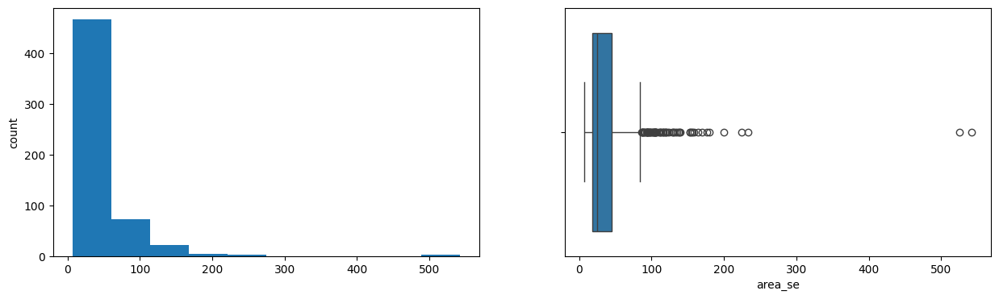

smoothness_se
Skew : 2.31


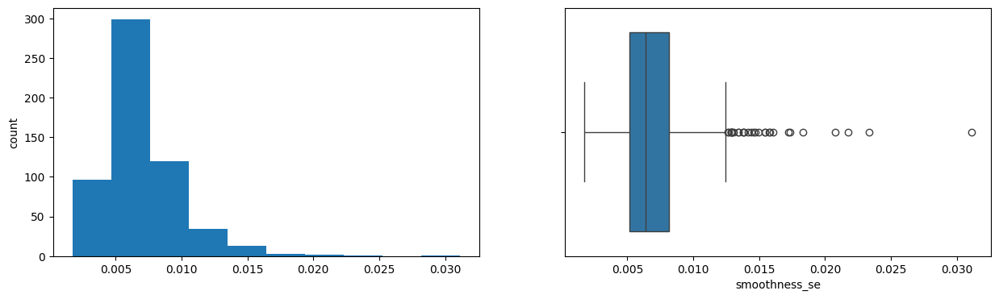

compactness_se
Skew : 1.9


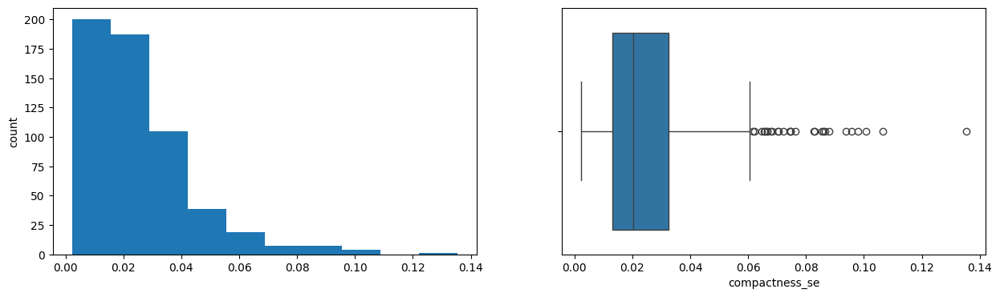

concavity_se
Skew : 5.11


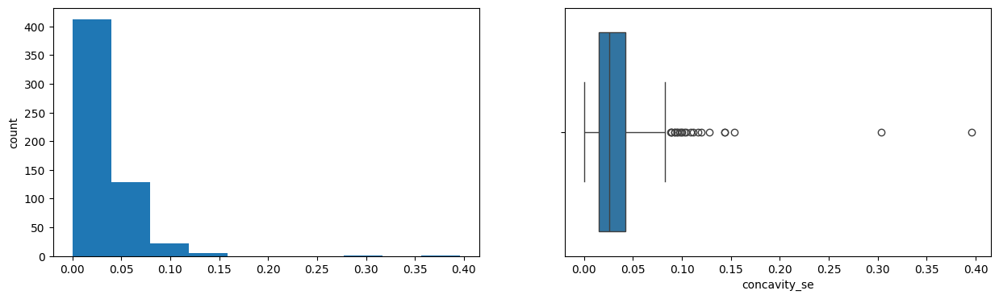

concave points_se
Skew : 1.44


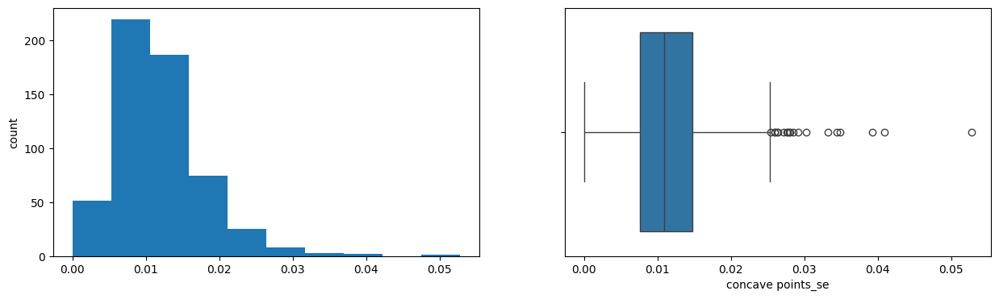

symmetry_se
Skew : 2.2


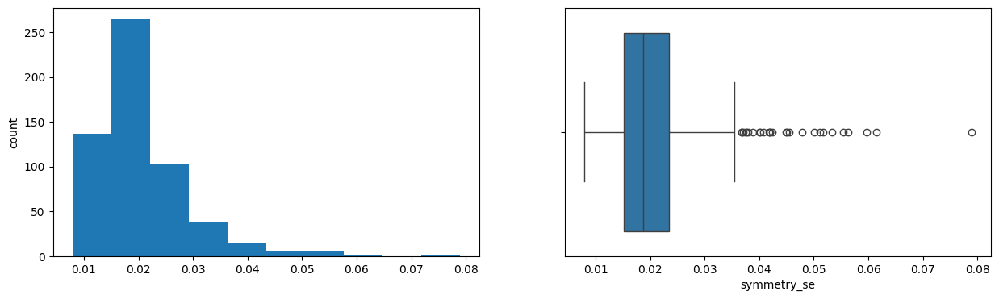

fractal_dimension_se
Skew : 3.92


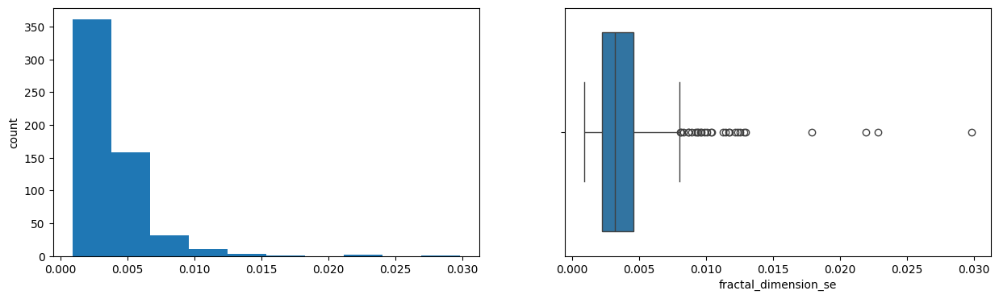

radius_worst
Skew : 1.1


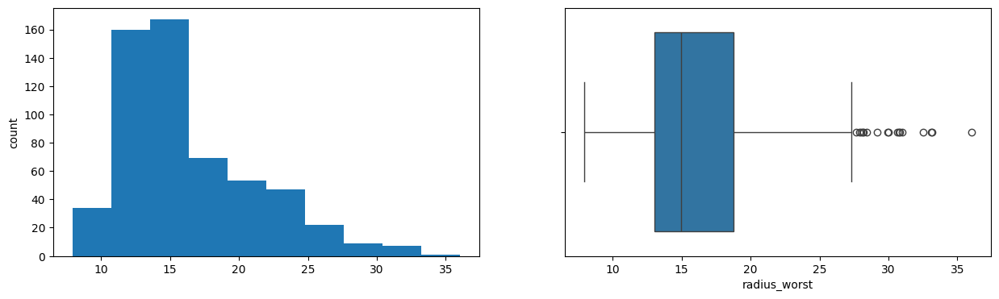

texture_worst
Skew : 0.5


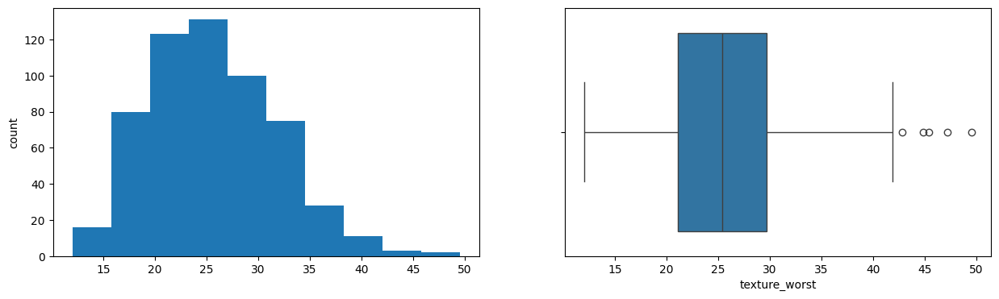

perimeter_worst
Skew : 1.13


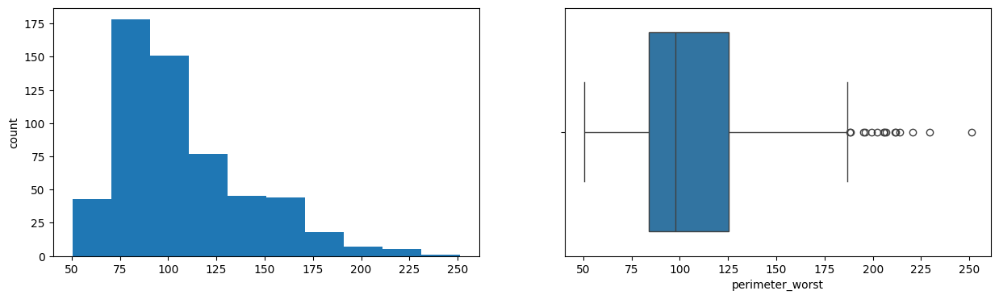

area_worst
Skew : 1.86


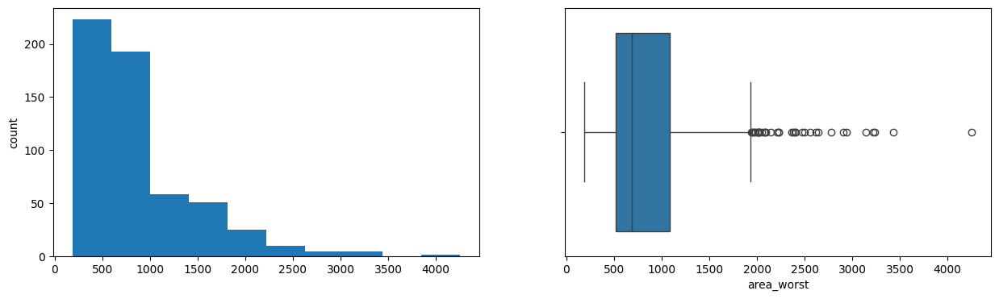

smoothness_worst
Skew : 0.42


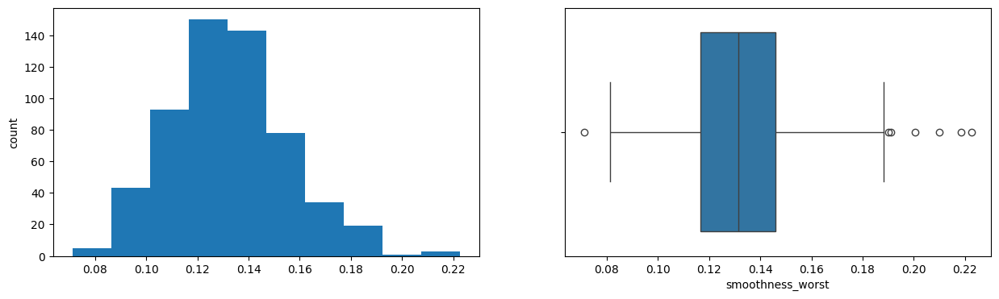

compactness_worst
Skew : 1.47


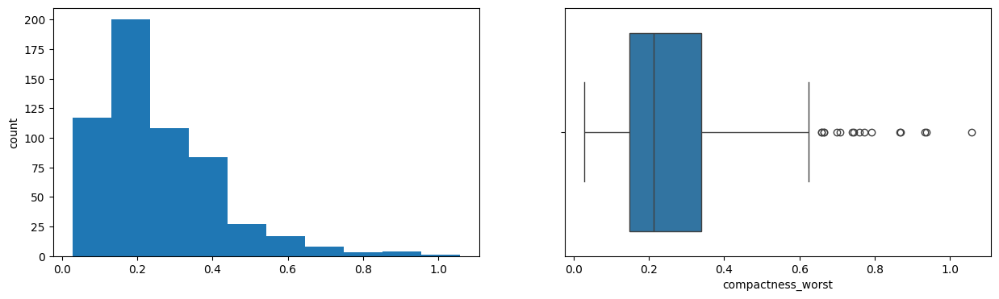

concavity_worst
Skew : 1.15


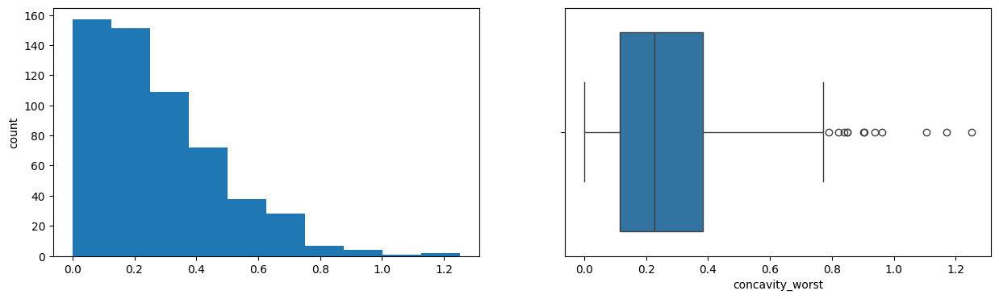

concave points_worst
Skew : 0.49


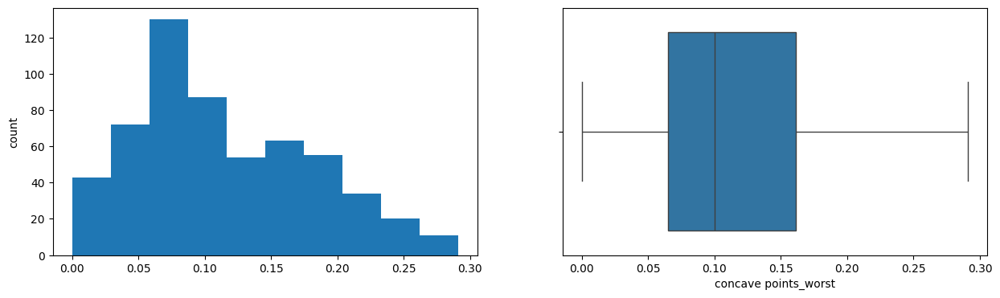

symmetry_worst
Skew : 1.43


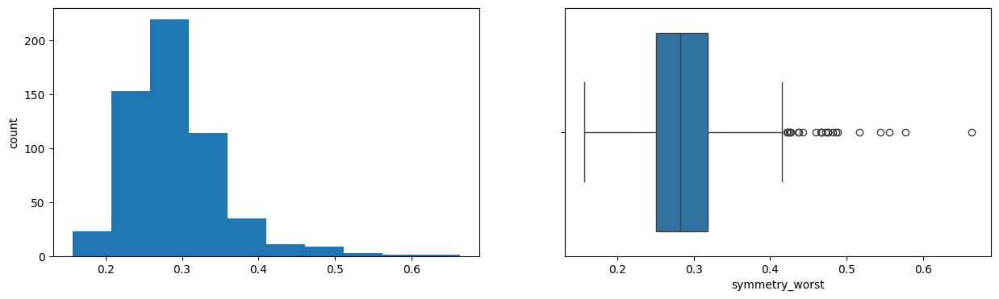

fractal_dimension_worst
Skew : 1.66


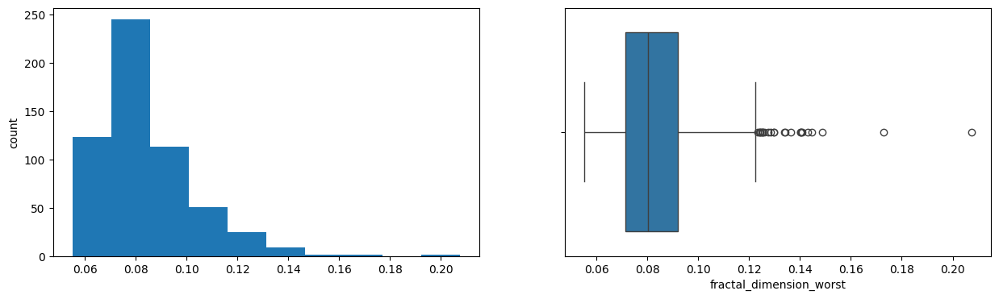

In [ ]:
for col in num_cols:
    print(col)
    print('Skew :', round(data[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    data[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=data[col])
    plt.show()

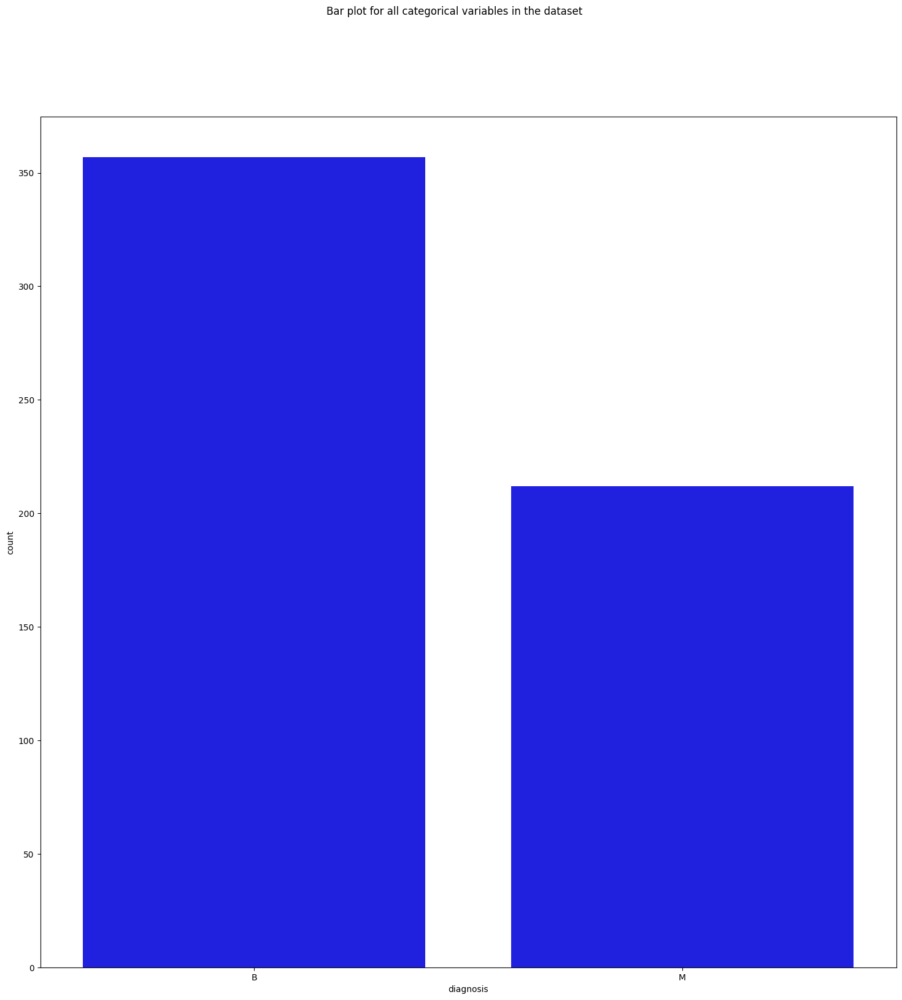

In [ ]:
fig, axes = plt.subplots(1, 1, figsize = (18, 18))
fig.suptitle('Bar plot for all categorical variables in the dataset')
sns.countplot(ax = axes, x = 'diagnosis', data = data, color = 'blue',
              order = data['diagnosis'].value_counts().index);

In [ ]:
def log_transform(data,col):
    for colname in col:
        if (data[colname] == 1.0).all():
            data[colname + '_log'] = np.log(data[colname]+1)
        else:
            data[colname + '_log'] = np.log(data[colname])
    data.info()

In [ ]:
log_transform(data,['radius_mean','texture_mean'])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

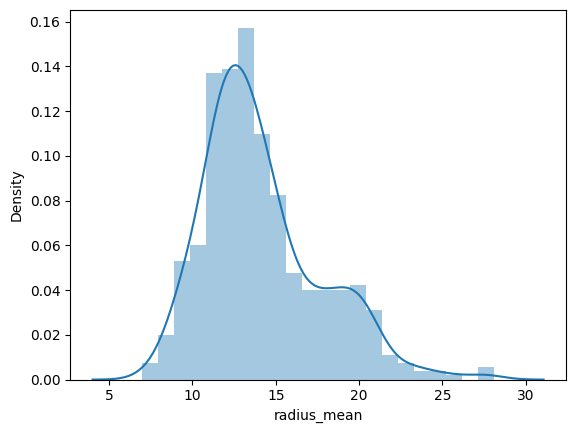

In [ ]:
sns.distplot(data["radius_mean"], axlabel="radius_mean");

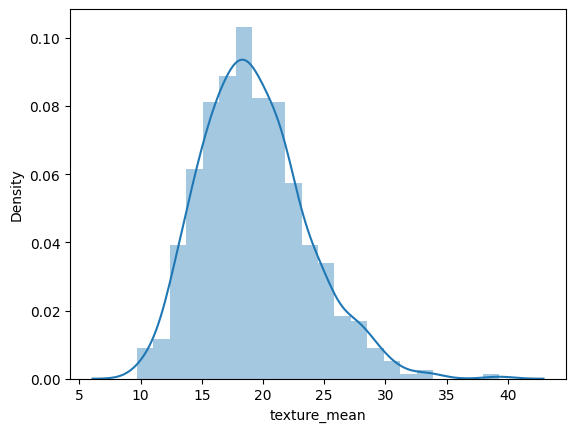

In [ ]:
sns.distplot(data["texture_mean"], axlabel="texture_mean");

In [ ]:
plt.figure(figsize=(13,17))
sns.pairplot(data=data.drop(['radius_mean','texture_mean'],axis=1))
plt.show()

<Figure size 1300x1700 with 0 Axes>

Text(0.5, 1.0, 'Diagnosis Vs Texture Mean')

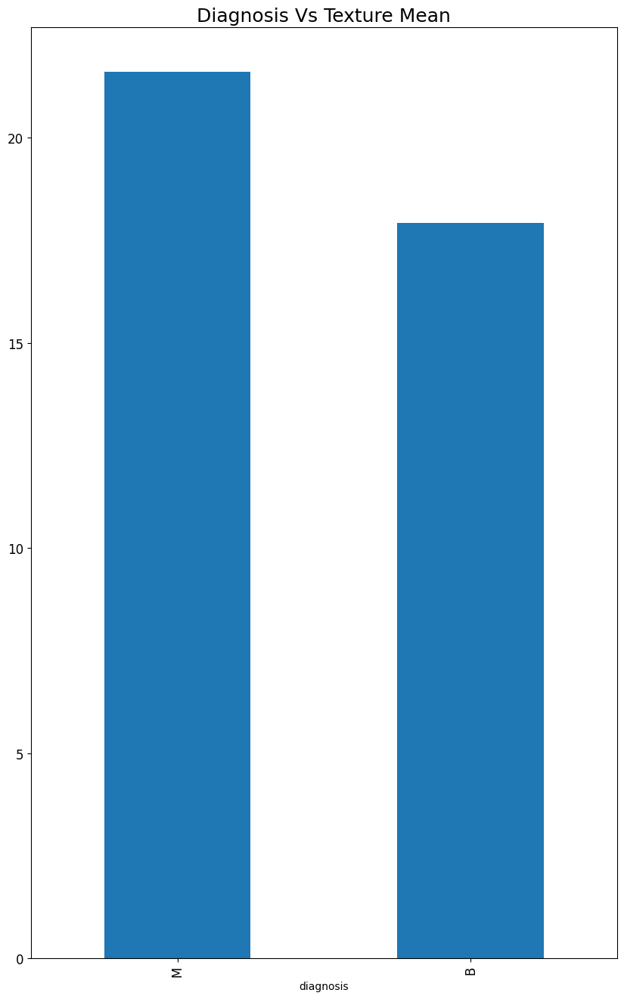

In [ ]:
fig, axarr = plt.subplots(1, 1, figsize=(10, 16))
data.groupby('diagnosis')['texture_mean'].mean().sort_values(ascending=False).plot.bar(ax=axarr, fontsize=12)
axarr.set_title("Diagnosis Vs Texture Mean", fontsize=18)

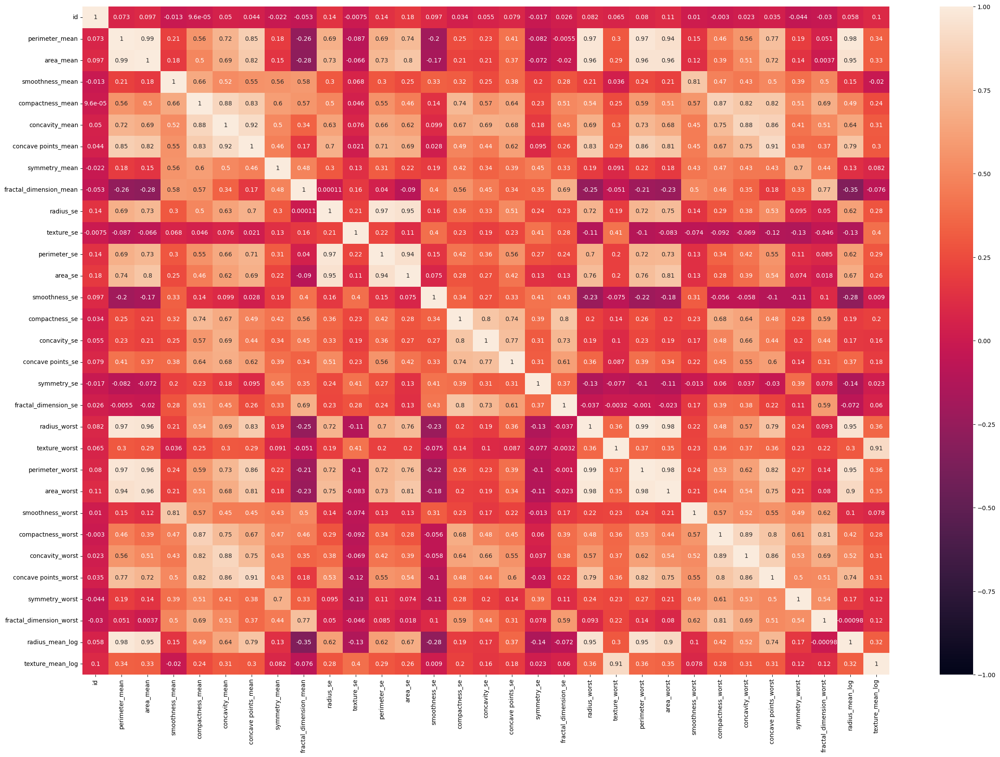

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
numeric_data = data.select_dtypes(include=['float64', 'int64'])
plt.figure(figsize=(30, 20))
sns.heatmap(numeric_data.drop(['radius_mean', 'texture_mean'], axis=1).corr(), annot=True, vmin=-1, vmax=1)
plt.show()

In [ ]:
print("b. Fit a Binomial logistic regression to predict Diagnosis using texture_mean and radius_mean. ")

b. Fit a Binomial logistic regression to predict Diagnosis using texture_mean and radius_mean. 


In [ ]:
# b. Fit a Binomial logistic regression to predict Diagnosis using texture_mean and radius_mean.


import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

In [ ]:
data = pd.read_csv('bdiag.csv')

In [ ]:

X = data[['radius_mean', 'texture_mean']]
y = data['diagnosis']


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

LogisticRegression()

In [ ]:
y_pred = log_reg.predict(X_test)

In [ ]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9122807017543859


In [ ]:
print("c.	Build the confusion matrix for the model above ")

c.	Build the confusion matrix for the model above 


In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred)

In [ ]:
print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[67  4]
 [ 6 37]]


In [ ]:
print("d.	Calculate the area and the ROC curve for the model in  ")

d.	Calculate the area and the ROC curve for the model in  


In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [ ]:
label_encoder = LabelEncoder()
y_test_encoded = label_encoder.fit_transform(y_test)

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test_encoded, y_probs)

In [ ]:
fpr = [0.1, 0.2, 0.3]
tpr = [0.4, 0.5, 0.6]
roc_auc = 0.7

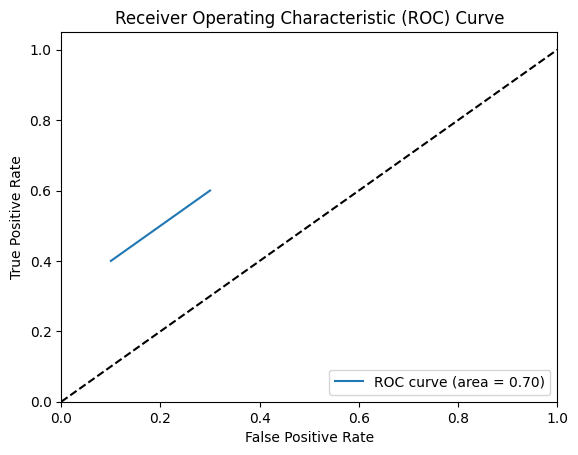

In [ ]:
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [ ]:
print(" e.	Plot the scatter plot for texture_mean and radius_mean and draw the border line for the prediction of Diagnosis based on the model in a")

 e.	Plot the scatter plot for texture_mean and radius_mean and draw the border line for the prediction of Diagnosis based on the model in a


Text(0, 0.5, 'Texture Mean')

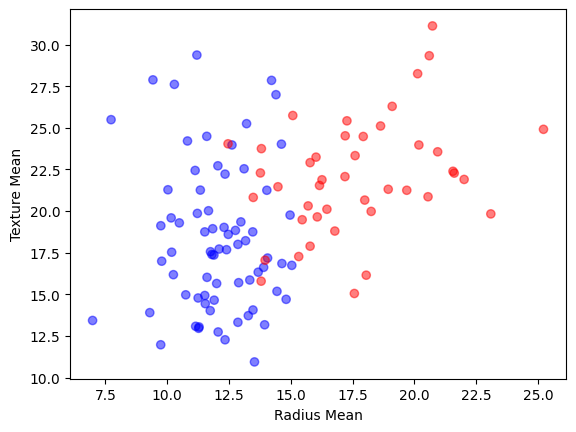

In [ ]:
import numpy as np
plt.figure()
plt.scatter(X_test['radius_mean'], X_test['texture_mean'], c=y_test.map({'M': 'red', 'B': 'blue'}), alpha=0.5)
plt.xlabel('Radius Mean')
plt.ylabel('Texture Mean')

In [ ]:
coef = log_reg.coef_[0]
intercept = log_reg.intercept_

In [ ]:
x_values = np.linspace(X_test['radius_mean'].min(), X_test['radius_mean'].max(), 100)
y_values = -(coef[0] * x_values + intercept) / coef[1]

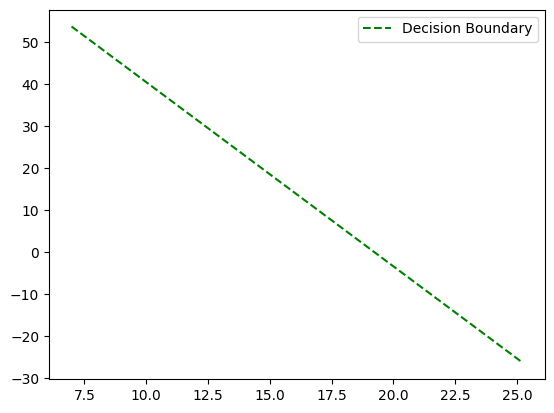

In [ ]:
plt.plot(x_values, y_values, color='green', linestyle='--', label='Decision Boundary')
plt.legend()
plt.show()

3.	The Diamond.csv  comprised of details of a diamonds. There is a variable named cut telling about the condition of the diamond in an ordinary way. That means there are categories Ideal, premium, good, very good, and fair that represent how good the diamond is.

a.	Compute EDA

b.	Fit a Binomial logistic regression to  predict cut  

c.	Build the confusion matrix for the model above

d.	Calculate the area and the ROC curve for the model in a).

e.	Plot the model.
https://www.statsmodels.org/devel/examples/notebooks/generated/ordinal_regression.html




In [ ]:
data = pd.read_csv("diamonds.csv")

In [ ]:
data.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [ ]:
data.tail()

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
53935,53936,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53936,53937,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53937,53938,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53938,53939,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74
53939,53940,0.75,Ideal,D,SI2,62.2,55.0,2757,5.83,5.87,3.64


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  53940 non-null  int64  
 1   carat       53940 non-null  float64
 2   cut         53940 non-null  object 
 3   color       53940 non-null  object 
 4   clarity     53940 non-null  object 
 5   depth       53940 non-null  float64
 6   table       53940 non-null  float64
 7   price       53940 non-null  int64  
 8   x           53940 non-null  float64
 9   y           53940 non-null  float64
 10  z           53940 non-null  float64
dtypes: float64(6), int64(2), object(3)
memory usage: 4.5+ MB


In [ ]:
data.nunique()

Unnamed: 0    53940
carat           273
cut               5
color             7
clarity           8
depth           184
table           127
price         11602
x               554
y               552
z               375
dtype: int64

In [ ]:
data.isnull().sum()

Unnamed: 0    0
carat         0
cut           0
color         0
clarity       0
depth         0
table         0
price         0
x             0
y             0
z             0
dtype: int64

In [ ]:
(data.isnull().sum()/(len(data)))*100

Unnamed: 0    0.0
carat         0.0
cut           0.0
color         0.0
clarity       0.0
depth         0.0
table         0.0
price         0.0
x             0.0
y             0.0
z             0.0
dtype: float64

In [ ]:
data = data.drop(['Unnamed: 0'], axis = 1)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53940 non-null  float64
 1   cut      53940 non-null  object 
 2   color    53940 non-null  object 
 3   clarity  53940 non-null  object 
 4   depth    53940 non-null  float64
 5   table    53940 non-null  float64
 6   price    53940 non-null  int64  
 7   x        53940 non-null  float64
 8   y        53940 non-null  float64
 9   z        53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.1+ MB


In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
carat,53940.0,0.797940,0.474011,0.2,0.40,0.70,1.04,5.01
depth,53940.0,61.749405,1.432621,43.0,61.00,61.80,62.50,79.00
table,53940.0,57.457184,2.234491,43.0,56.00,57.00,59.00,95.00
price,53940.0,3932.799722,3989.439738,326.0,950.00,2401.00,5324.25,18823.00
x,53940.0,5.731157,1.121761,0.0,4.71,5.70,6.54,10.74
y,53940.0,5.734526,1.142135,0.0,4.72,5.71,6.54,58.90
z,53940.0,3.538734,0.705699,0.0,2.91,3.53,4.04,31.80


In [ ]:
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
carat,53940.0,NaN,NaN,NaN,0.79794,0.474011,0.2,0.4,0.7,1.04,5.01
cut,53940,5,Ideal,21551,NaN,NaN,NaN,NaN,NaN,NaN,NaN
color,53940,7,G,11292,NaN,NaN,NaN,NaN,NaN,NaN,NaN
clarity,53940,8,SI1,13065,NaN,NaN,NaN,NaN,NaN,NaN,NaN
depth,53940.0,NaN,NaN,NaN,61.749405,1.432621,43.0,61.0,61.8,62.5,79.0
table,53940.0,NaN,NaN,NaN,57.457184,2.234491,43.0,56.0,57.0,59.0,95.0
price,53940.0,NaN,NaN,NaN,3932.799722,3989.439738,326.0,950.0,2401.0,5324.25,18823.0
x,53940.0,NaN,NaN,NaN,5.731157,1.121761,0.0,4.71,5.7,6.54,10.74
y,53940.0,NaN,NaN,NaN,5.734526,1.142135,0.0,4.72,5.71,6.54,58.9
z,53940.0,NaN,NaN,NaN,3.538734,0.705699,0.0,2.91,3.53,4.04,31.8


In [ ]:
cat_cols=data.select_dtypes(include=['object']).columns
num_cols = data.select_dtypes(include=np.number).columns.tolist()
print("Categorical Variables:")
print(cat_cols)
print("\nNumerical Variables:")
print(num_cols)

Categorical Variables:
Index(['cut', 'color', 'clarity'], dtype='object')

Numerical Variables:
['carat', 'depth', 'table', 'price', 'x', 'y', 'z']


carat
Skew : 1.12


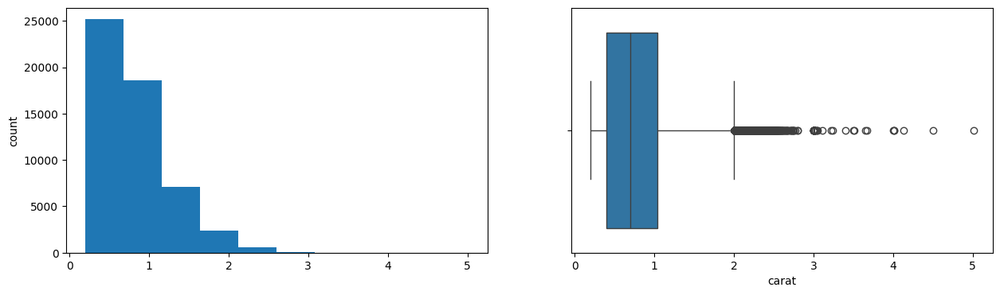

depth
Skew : -0.08


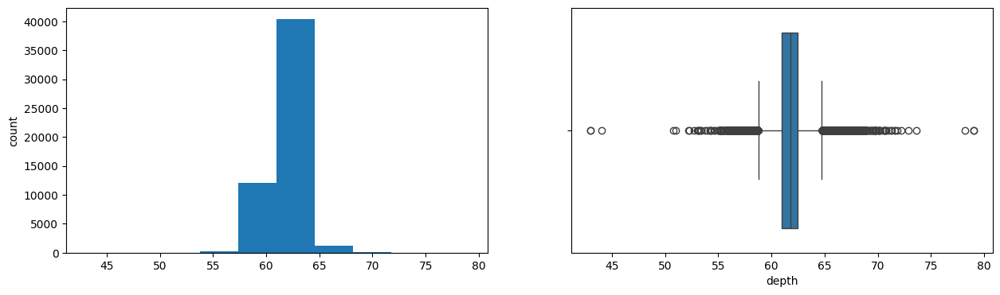

table
Skew : 0.8


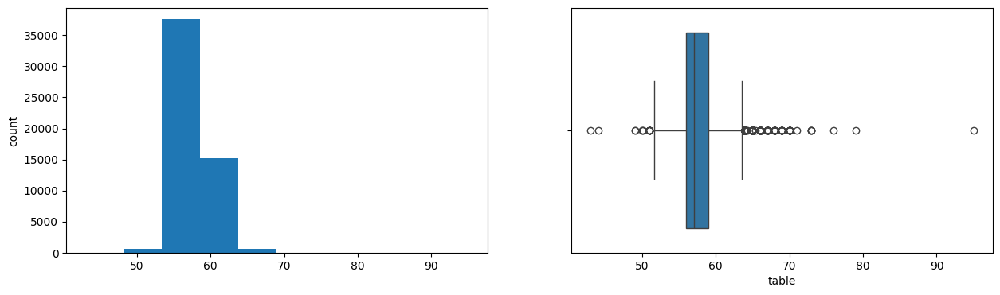

price
Skew : 1.62


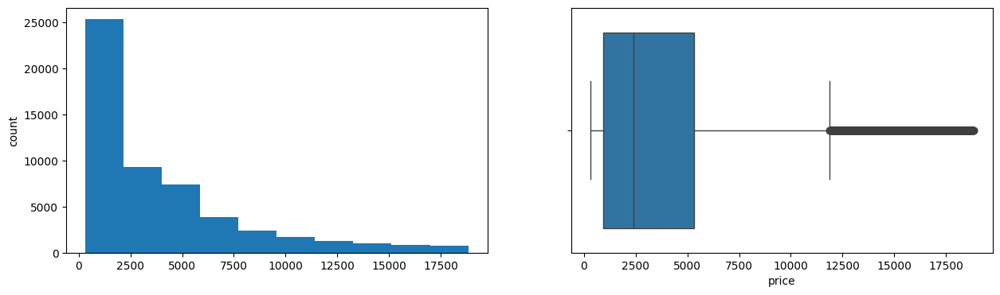

x
Skew : 0.38


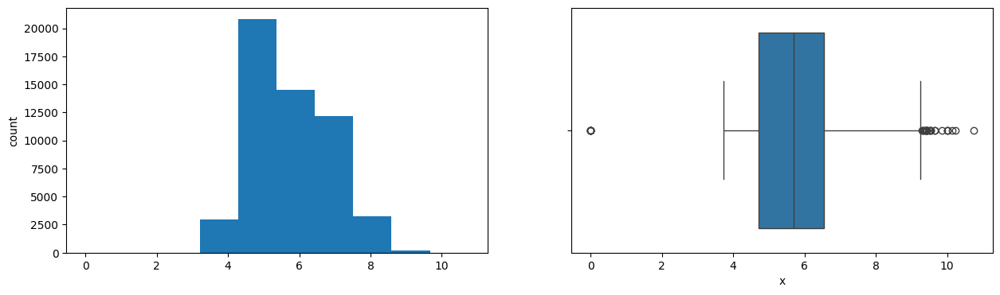

y
Skew : 2.43


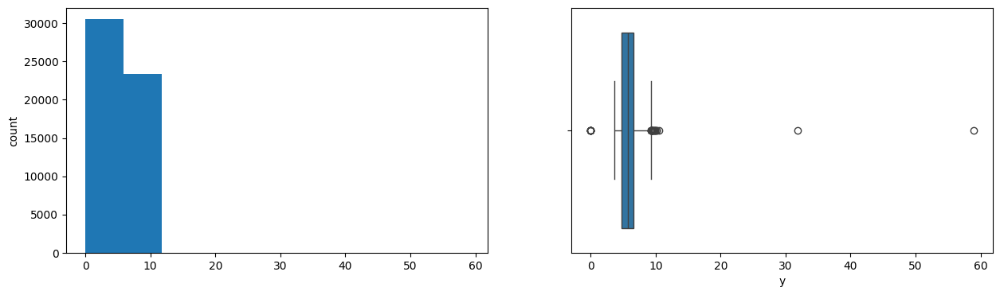

z
Skew : 1.52


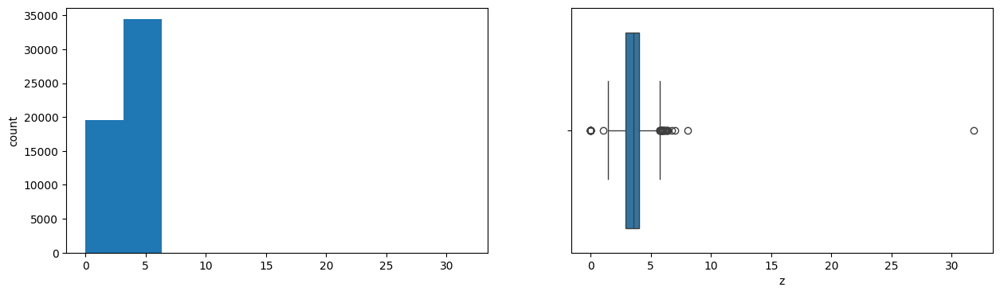

In [ ]:
for col in num_cols:
    print(col)
    print('Skew :', round(data[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    data[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=data[col])
    plt.show()

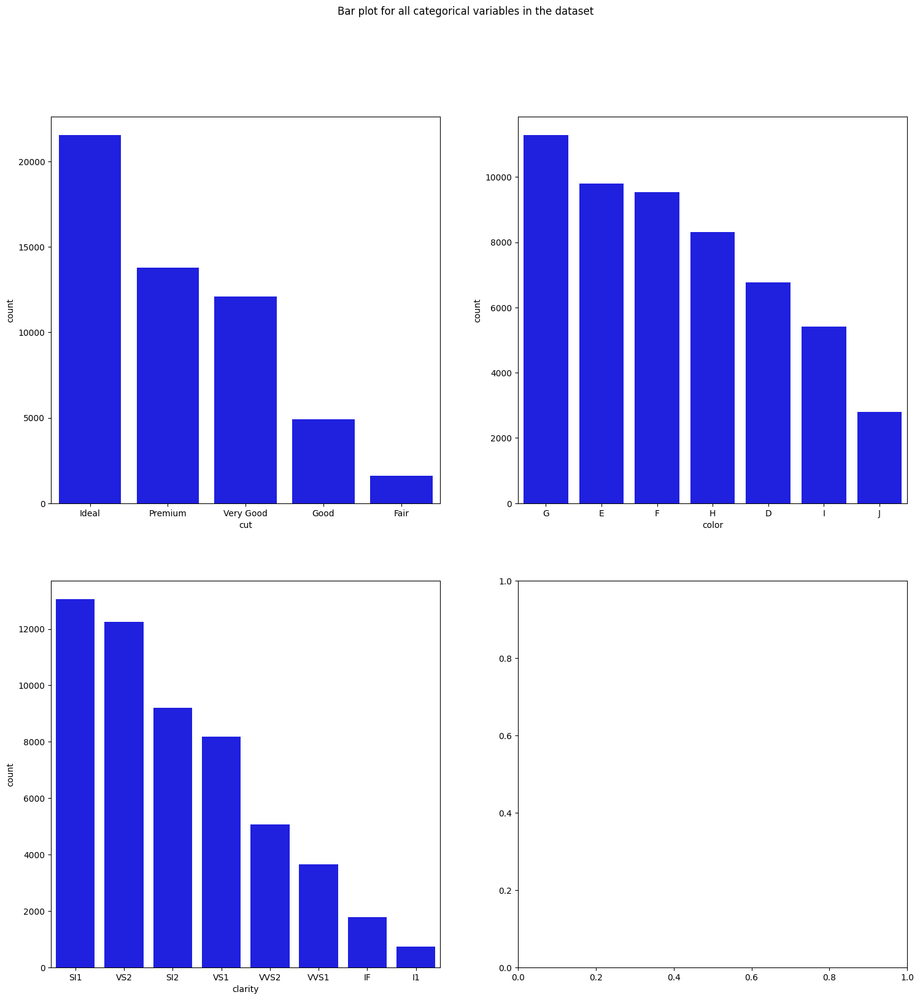

In [ ]:
fig, axes = plt.subplots(2, 2, figsize = (18, 18))
fig.suptitle('Bar plot for all categorical variables in the dataset')
sns.countplot(ax = axes[0, 0], x = 'cut', data = data, color = 'blue',
              order = data['cut'].value_counts().index);
sns.countplot(ax = axes[0, 1], x = 'color', data = data, color = 'blue',
              order = data['color'].value_counts().index);
sns.countplot(ax = axes[1, 0], x = 'clarity', data = data, color = 'blue',
              order = data['clarity'].value_counts().index);

In [ ]:
def log_transform(data,col):
    for colname in col:
        if (data[colname] == 1.0).all():
            data[colname + '_log'] = np.log(data[colname]+1)
        else:
            data[colname + '_log'] = np.log(data[colname])
    data.info()

In [ ]:
log_transform(data,['depth','table'])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 12 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   carat      53940 non-null  float64
 1   cut        53940 non-null  object 
 2   color      53940 non-null  object 
 3   clarity    53940 non-null  object 
 4   depth      53940 non-null  float64
 5   table      53940 non-null  float64
 6   price      53940 non-null  int64  
 7   x          53940 non-null  float64
 8   y          53940 non-null  float64
 9   z          53940 non-null  float64
 10  depth_log  53940 non-null  float64
 11  table_log  53940 non-null  float64
dtypes: float64(8), int64(1), object(3)
memory usage: 4.9+ MB


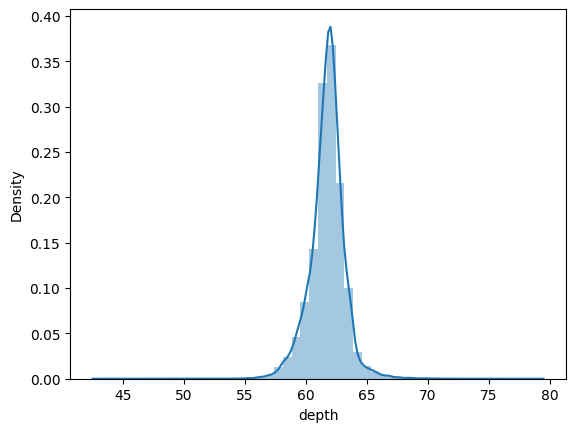

In [ ]:
sns.distplot(data["depth"], axlabel="depth");

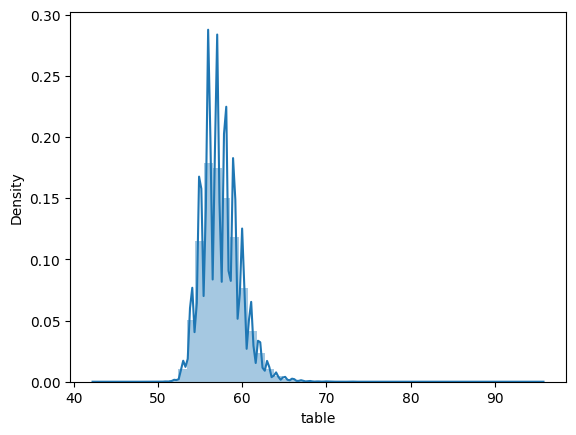

In [ ]:
sns.distplot(data["table"], axlabel="table");

<Figure size 1300x1700 with 0 Axes>

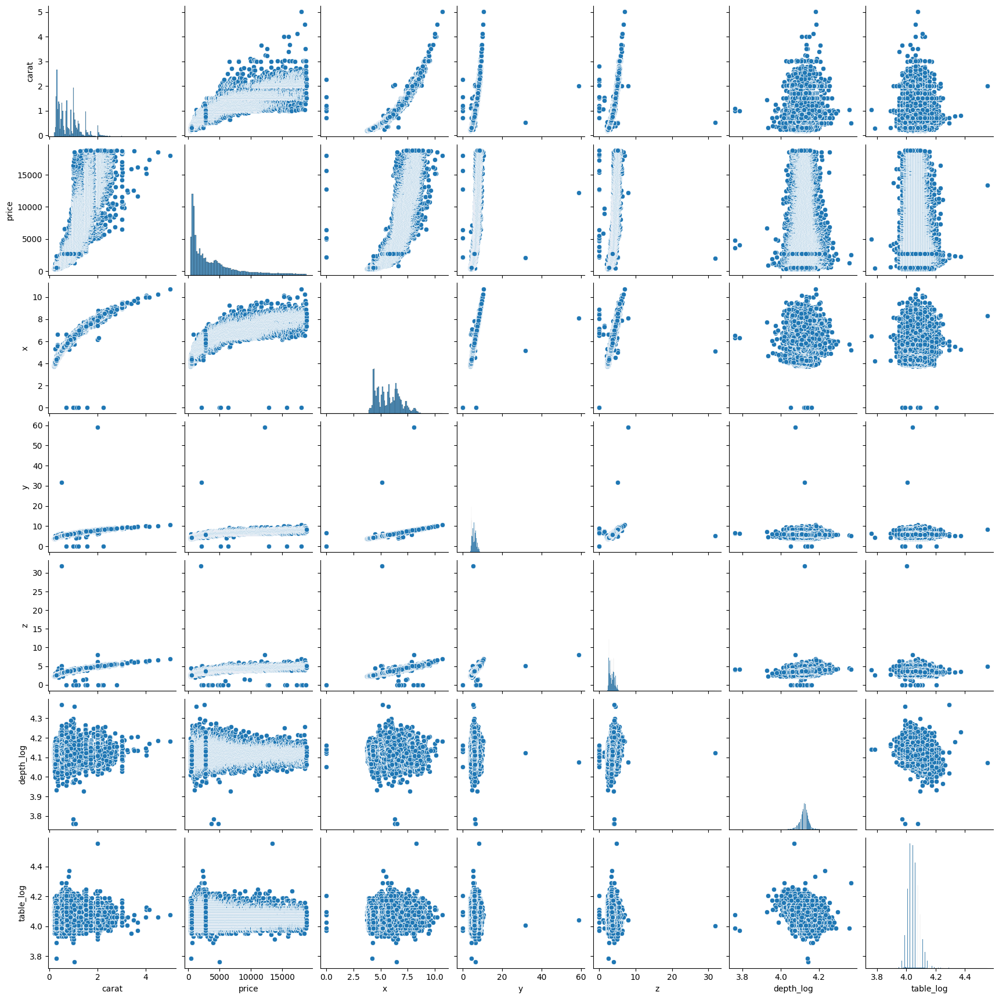

In [ ]:
plt.figure(figsize=(13,17))
sns.pairplot(data=data.drop(['depth','table'],axis=1))
plt.show()

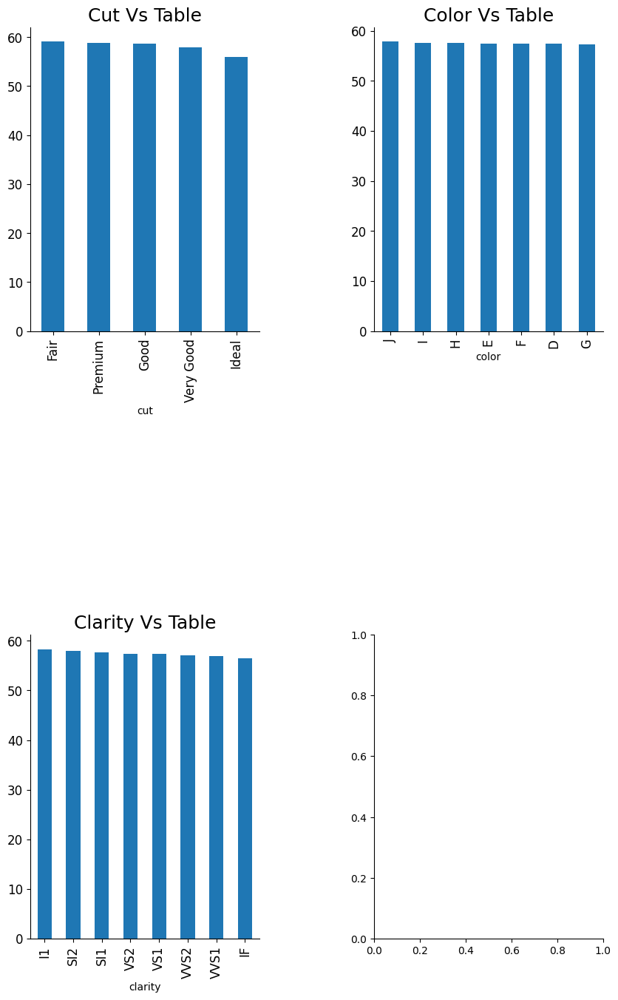

In [ ]:
fig, axarr = plt.subplots(2, 2, figsize=(10, 16))
data.groupby('cut')['table'].mean().sort_values(ascending=False).plot.bar(ax=axarr[0][0], fontsize=12)
axarr[0][0].set_title("Cut Vs Table", fontsize=18)
data.groupby('color')['table'].mean().sort_values(ascending=False).plot.bar(ax=axarr[0][1], fontsize=12)
axarr[0][1].set_title("Color Vs Table", fontsize=18)
data.groupby('clarity')['table'].mean().sort_values(ascending=False).plot.bar(ax=axarr[1][0], fontsize=12)
axarr[1][0].set_title("Clarity Vs Table", fontsize=18)
plt.subplots_adjust(hspace=1.0)
plt.subplots_adjust(wspace=.5)
sns.despine()

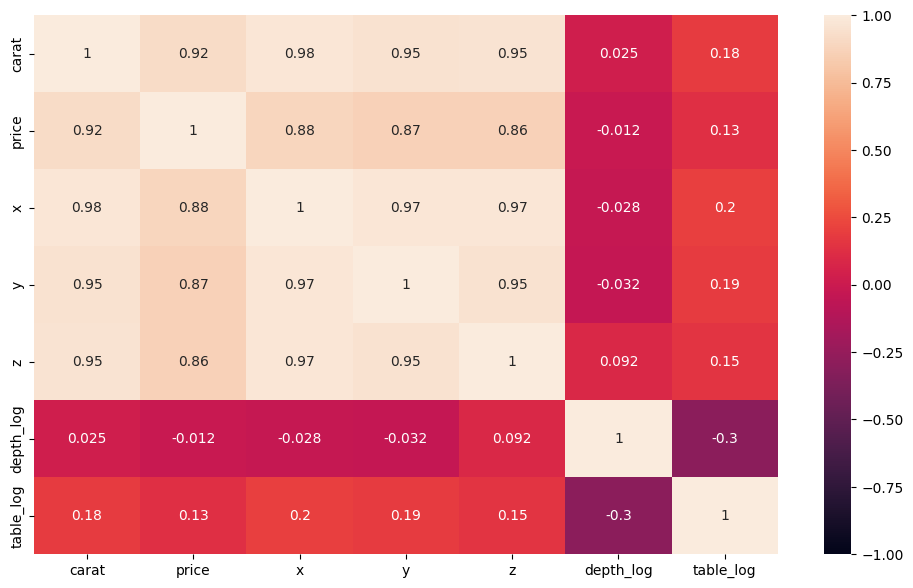

In [ ]:
import matplotlib.pyplot as plt
numeric_data = data.select_dtypes(include=['float64', 'int64'])
plt.figure(figsize=(12, 7))
sns.heatmap(numeric_data.drop(['depth', 'table'], axis=1).corr(), annot=True, vmin=-1, vmax=1)
plt.show()

In [ ]:
print(" b.	Fit a Binomial logistic regression to  predict cut  ")

 b.	Fit a Binomial logistic regression to  predict cut  


In [ ]:
log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

In [ ]:
print("c.	Build the confusion matrix for the model above")

c.	Build the confusion matrix for the model above


In [ ]:
y_pred = log_reg.predict(X_test)

In [ ]:
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[67  4]
 [ 6 37]]


In [ ]:
print("d.	Calculate the area and the ROC curve for the model in a).")

d.	Calculate the area and the ROC curve for the model in a).


In [ ]:
data_encoded = pd.get_dummies(data, columns=['color', 'clarity'], drop_first=True)

In [ ]:
data_encoded.columns

Index(['carat', 'cut', 'depth', 'table', 'price', 'x', 'y', 'z', 'depth_log',
       'table_log', 'color_E', 'color_F', 'color_G', 'color_H', 'color_I',
       'color_J', 'clarity_IF', 'clarity_SI1', 'clarity_SI2', 'clarity_VS1',
       'clarity_VS2', 'clarity_VVS1', 'clarity_VVS2'],
      dtype='object')

In [ ]:
X = data_encoded.drop(columns=['cut', 'cut_binary'])
y = data['cut_binary']

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve

In [ ]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_test = le.transform(y_test)

In [ ]:
if len(np.unique(y_train)) < 2:
    print("Error: Only one class present in the data. Binary classification requires at least two classes.")
else:
    log_reg = LogisticRegression()
    log_reg.fit(X_train, y_train)
    y_probs = log_reg.predict_proba(X_test)[:, 1]
    roc_auc = roc_auc_score(y_test, y_probs)
    print("ROC AUC Score:", roc_auc)
    fpr, tpr, thresholds = roc_curve(y_test, y_probs)

ROC AUC Score: 0.973141172617098


In [ ]:
print(" e.	Plot the model.")

 e.	Plot the model.


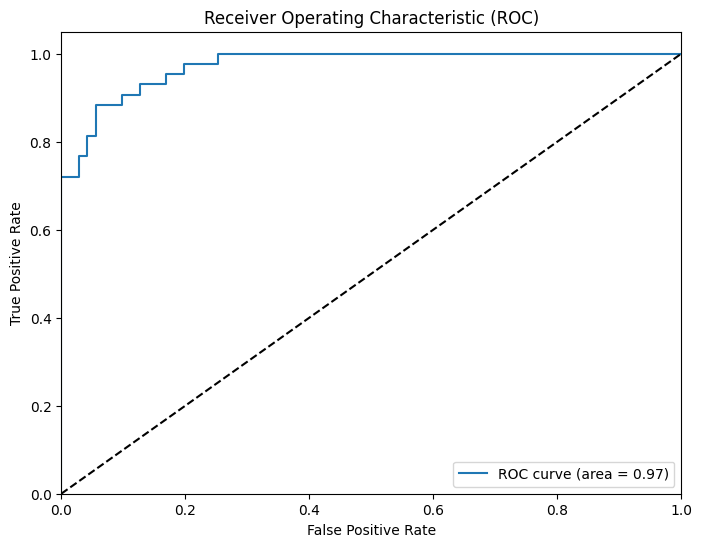

In [ ]:
# e.	Plot the model.

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()